In [1]:
import pandas as pd
import os
import networkx as nx
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from networkx.algorithms import bipartite
import warnings
from collections import Counter
warnings.simplefilter(action="ignore", category=pd.errors.SettingWithCopyWarning)

# Task 1: Constructing a Bipartite Network

In [ ]:
folder_path = "dataset/Temporal_Data/"
list_of_df = []

for year in range(2016, 2024):
    if year == 2023:
        quarters = [1, 2]
    else:
        quarters = [1, 2, 3, 4]
        
    for quarter in quarters:
        file_name = f'{year}_Q{quarter}.xlsx'
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_excel(file_path, header=None)
        investor = df.columns[0]
        df_reshaped = df.melt(id_vars=[investor], value_name='stock')
        df_cleaned = df_reshaped.dropna(subset=['stock'])
        df_cleaned['quarter'] = f'{year}_Q{quarter}'
        list_of_df.append(df_cleaned)

data_merged = pd.concat(list_of_df, ignore_index=True)
data_merged.rename(columns={0:'investor'}, inplace=True)
data_merged.sort_values(by=['quarter', 'investor'], inplace=True)
data_merged.drop(columns=['variable'], inplace=True)
data_merged.reset_index(drop=True, inplace=True)

In [3]:
data_merged.head(10)

,investor,stock,quarter
0,Alex Roepers - Atlantic Investment Management,OI,2016_Q1
1,Alex Roepers - Atlantic Investment Management,IM,2016_Q1
2,Alex Roepers - Atlantic Investment Management,GT,2016_Q1
3,Alex Roepers - Atlantic Investment Management,TGI,2016_Q1
4,Alex Roepers - Atlantic Investment Management,EMN,2016_Q1
5,Alex Roepers - Atlantic Investment Management,FMC,2016_Q1
6,Alex Roepers - Atlantic Investment Management,HAR,2016_Q1
7,Alex Roepers - Atlantic Investment Management,ASH,2016_Q1
8,Alex Roepers - Atlantic Investment Management,HPE,2016_Q1
9,Alex Roepers - Atlantic Investment Management,MGA,2016_Q1


### 1.1 Visualizing Bipartite Network

In [4]:
G = nx.Graph()
investor_names = data_merged['investor'].unique()
stock_names = data_merged['stock'].unique()

G.add_nodes_from(investor_names, bipartite=0)
G.add_nodes_from(stock_names, bipartite=1)

for index, row in data_merged.iterrows():
    investor = row['investor']
    stock = row['stock']

    if G.has_edge(investor, stock):
        G[investor][stock]['weight'] += 1
    else:
        G.add_edge(investor, stock, weight=1)

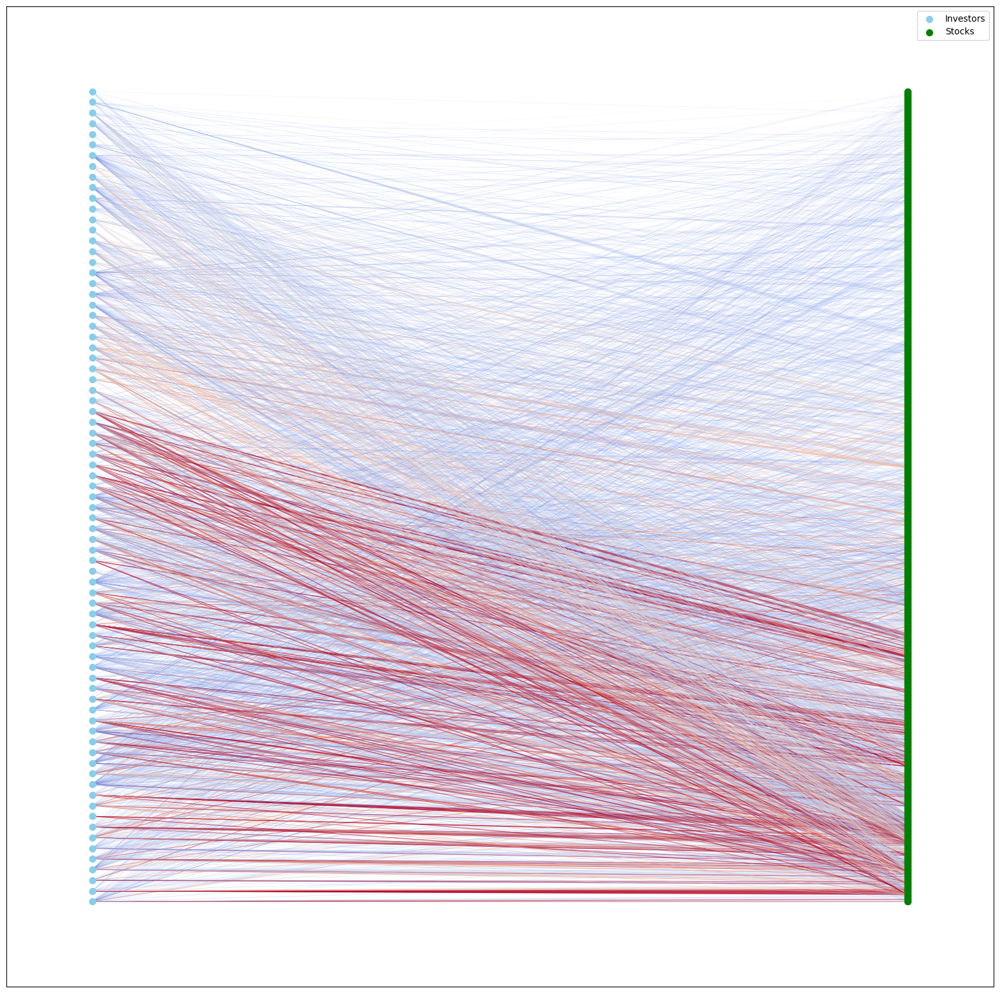

In [5]:
plt.figure(figsize=(20, 20))

pos = nx.bipartite_layout(G, investor_names, align='vertical', scale=10, center=(0, 0)) 
pos_adjusted = {node: (x * 3, y) for node, (x, y) in pos.items()} 

nx.draw_networkx_nodes(G, pos_adjusted, nodelist=investor_names, node_color='skyblue', node_shape='o', node_size=50, label='Investors')
nx.draw_networkx_nodes(G, pos_adjusted, nodelist=stock_names, node_color='green', node_shape='o', node_size=50, label='Stocks')

edges = G.edges(data=True)
nx.draw_networkx_edges(
    G, 
    pos_adjusted, 
    edgelist=edges, 
    width=[(data['weight']) * 0.03 for _, _, data in edges],
    edge_color=[data['weight'] for _, _, data in edges],
    edge_cmap=mpl.cm.coolwarm,
    alpha=0.6
)

label_pos_investors = {node: (x + 1, y) for node, (x, y) in pos_adjusted.items() if node in investor_names}
label_pos_stocks = {node: (x + 1.5, y) for node, (x, y) in pos_adjusted.items() if node in stock_names}
label_pos = {**label_pos_investors, **label_pos_stocks}

plt.legend(scatterpoints=1, loc='best')

plt.savefig('bipartite_network.png')

plt.show()


### 1.2 Bipartite Ego Network

In [6]:
ego_node = 'MSFT'
ego_network_bi = nx.ego_graph(G, ego_node)

print(f'Number of nodes in ego network: {len(ego_network_bi.nodes)}.')
print(f'Number of links in ego network: {len(ego_network_bi.edges)}.')
print(f'Density: {nx.density(ego_network_bi)}.')
print(f'Degree of MSFT: {ego_network_bi.degree('MSFT')}.')

Number of nodes in ego network: 34.
Number of links in ego network: 33.
Density: 0.058823529411764705.
Degree of MSFT: 33.


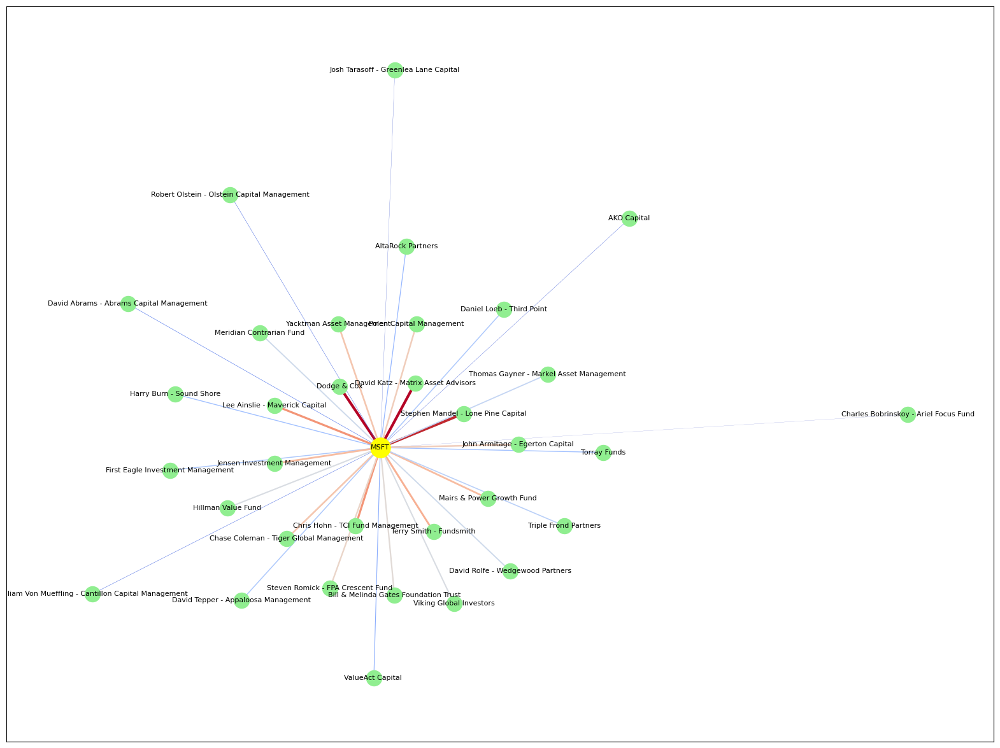

In [7]:
pos = nx.spring_layout(ego_network_bi)

plt.figure(figsize=(20,15))

nx.draw_networkx_nodes(
    ego_network_bi, 
    pos,
    nodelist=[ego_node],
    node_color='yellow', 
    node_size=500)

nx.draw_networkx_nodes(
    ego_network_bi, 
    pos,
    nodelist=[node for node in ego_network_bi.nodes if node != ego_node],
    node_color='lightgreen', 
    node_size=300)

edges = ego_network_bi.edges(data=True)

nx.draw_networkx_edges(
    ego_network_bi, 
    pos, 
    width=[(data['weight'])*0.1 for _, _, data in edges], 
    edge_color = [data['weight'] for _, _, data in edges],
    edge_cmap = mpl.cm.coolwarm
    )

nx.draw_networkx_labels(ego_network_bi, pos, font_size=8)

#plt.savefig('ego_network_bipartite.png')

plt.show()

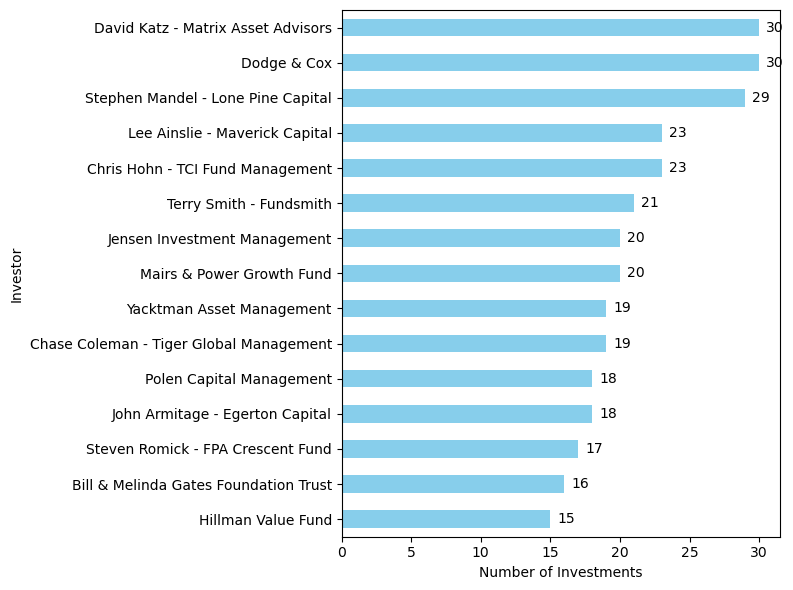

In [8]:
msft_investors = data_merged[data_merged['stock'] == 'MSFT']['investor'].value_counts()
top_msft = msft_investors.head(15)

# Investment frequency
plt.figure(figsize=(8,6))
top_msft.plot(kind='barh', color='skyblue')
plt.xlabel('Number of Investments')
plt.ylabel('Investor')

for index, freq in enumerate(top_msft):
    plt.text(freq + 0.5, index, str(freq), va='center', fontsize=10)

plt.gca().invert_yaxis() 
plt.tight_layout()
plt.savefig('msft_investors.png')
plt.show()

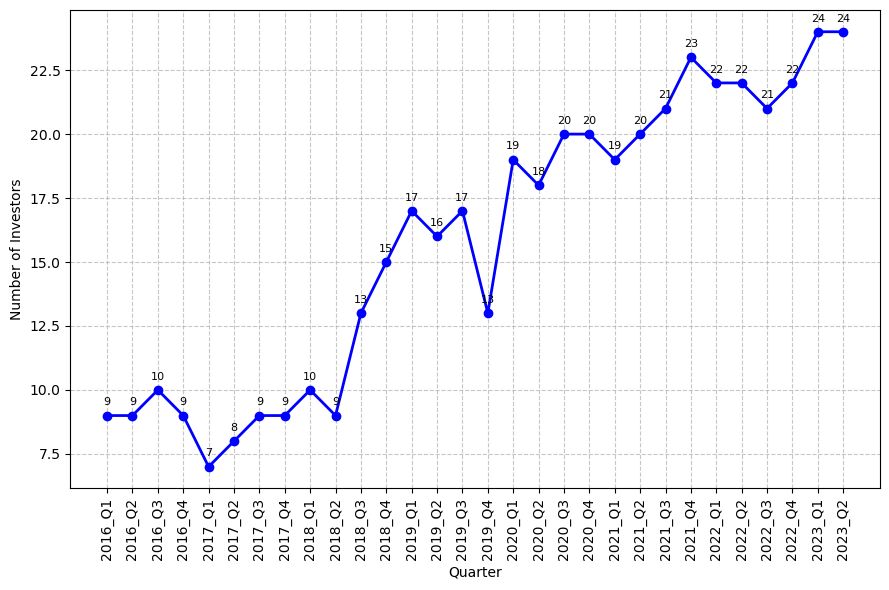

In [9]:
msft_investor_data = data_merged[data_merged['stock'] == 'MSFT'].groupby('quarter')['investor'].nunique()

plt.figure(figsize=(9, 6))
plt.plot(msft_investor_data.index, msft_investor_data.values, marker='o', color='blue', linewidth=2)
plt.xlabel('Quarter')
plt.ylabel('Number of Investors')
plt.xticks(rotation=90)
plt.grid(visible=True, linestyle='--', alpha=0.7)

for i, value in enumerate(msft_investor_data.values):
    plt.text(msft_investor_data.index[i], value + 0.4, f'{value}', fontsize=8, ha='center')

plt.tight_layout()
plt.savefig('msft_investor_timeseries.png')
plt.show()

# Task 2: Network Projections

### 2.1 Creating a Stock-side Network Projection

In [10]:
stock_projection = bipartite.weighted_projected_graph(G, stock_names)
print(stock_projection)
print(f'Network density: {nx.density(stock_projection)}')

Graph with 1529 nodes and 108956 edges
Network density: 0.09327178904187454


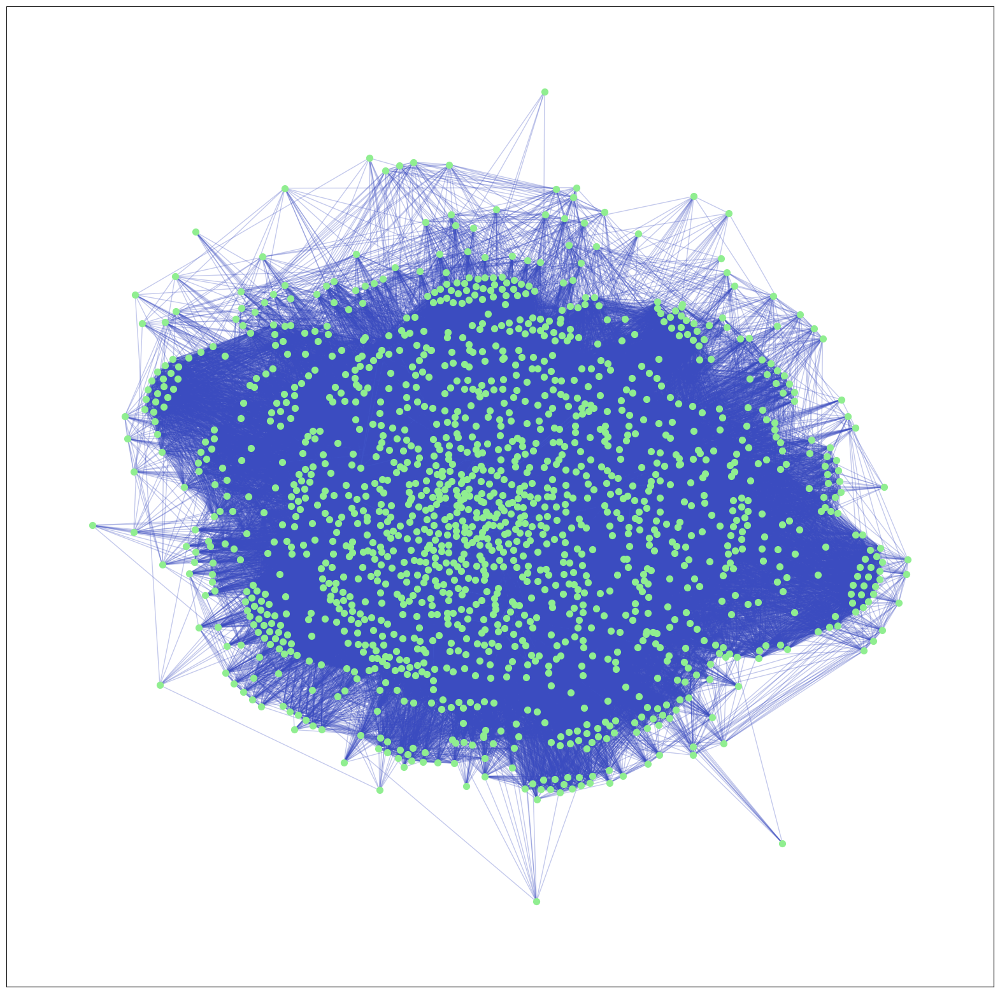

In [11]:
plt.figure(figsize=(20,20))

pos = nx.spring_layout(stock_projection, k=0.5, seed=42)

nx.draw_networkx_nodes(
    stock_projection,
    pos,
    node_color='lightgreen',
    node_size=50
)

edges = stock_projection.edges(data=True)

nx.draw_networkx_edges(
    stock_projection,
    pos,
    edge_color=[data['weight']*0.05 for _, _, data in edges],
    edge_cmap=mpl.cm.coolwarm,
    alpha=0.3
)

#nx.draw_networkx_labels(
#    stock_projection,
#    pos,
#    font_size=8
#)

plt.savefig('projection_network.png')
plt.show()

In [12]:
def network_filter(network, threshold):
    filtered_network = nx.subgraph_view(network, filter_edge = lambda source, target: network.edges[source, target]['weight'] >= threshold)
    print(f'Remaining edges: {len(filtered_network.edges)} out of {len(network.edges)}.')
    print(f'Density: {nx.density(filtered_network)}.')
    return filtered_network

Remaining edges: 95 out of 108956.
Density: 8.13247545704512e-05.


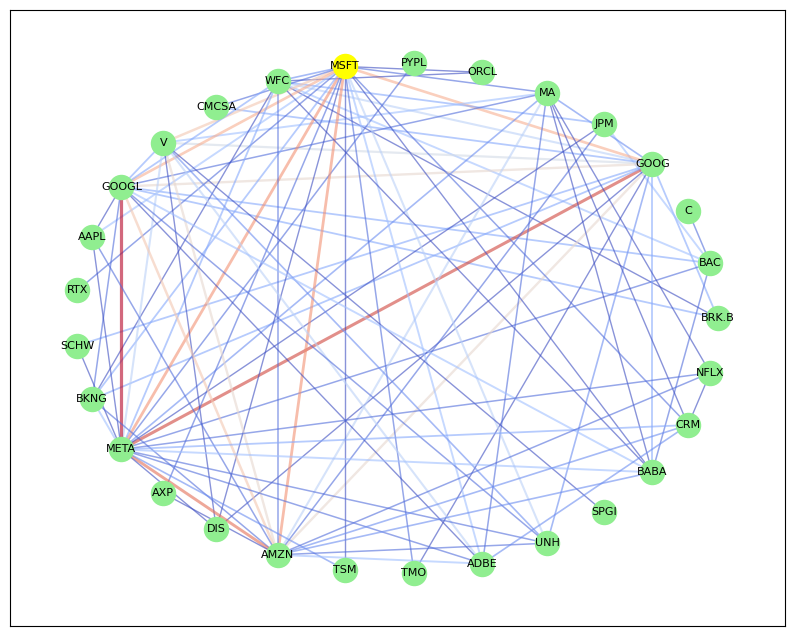

In [13]:
stock_projection_filtered = network_filter(stock_projection, 10)

isolated_nodes = list(nx.isolates(stock_projection_filtered))
network_copy = stock_projection_filtered.copy()
network_copy.remove_nodes_from(isolated_nodes)

plt.figure(figsize=(10, 8))

pos = nx.circular_layout(network_copy)

nx.draw_networkx_nodes(
    network_copy,
    pos,
    nodelist=['MSFT'],
    node_color='yellow',
    node_size=300
)

nx.draw_networkx_nodes(
    network_copy,
    pos,
    nodelist=[n for n in network_copy.nodes() if n != 'MSFT'],
    node_color='lightgreen',
    node_size=300
)

edges = network_copy.edges(data=True)
nx.draw_networkx_edges(
    network_copy,
    pos,
    edge_color=[data['weight'] for _, _, data in edges],
    edge_cmap=mpl.cm.coolwarm,
    width=[data['weight'] * 0.1 for _, _, data in edges],
    alpha=0.6
)

nx.draw_networkx_labels(
    network_copy,
    pos,
    font_size=8
)

# Show plot
plt.show()

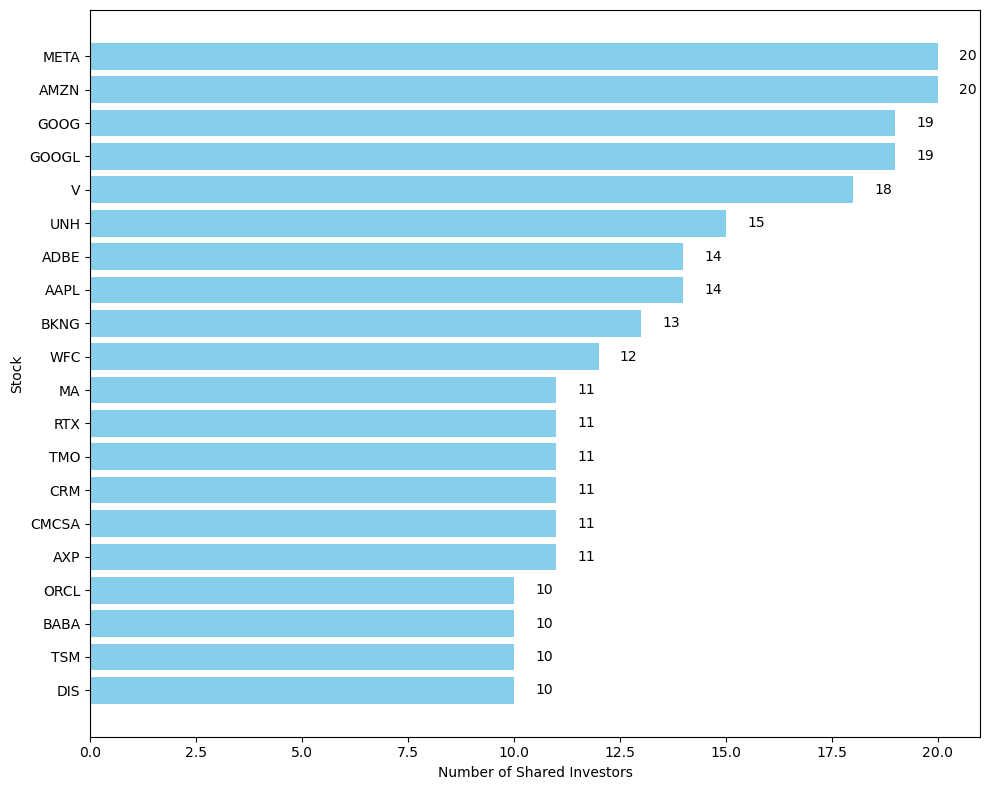

In [14]:
msft_edges = [(src, tar, data['weight']) for (src, tar, data) in stock_projection.edges(data=True) if 'MSFT' in (src, tar)]

msft_edges_sorted = sorted(msft_edges, key=lambda x: x[2], reverse=True)[:20]

stocks = [tar if src == 'MSFT' else src for src, tar, weight in msft_edges_sorted]
weights = [weight for _, _, weight in msft_edges_sorted]

plt.figure(figsize=(10, 8))
plt.barh(stocks, weights, color='skyblue')
plt.xlabel('Number of Shared Investors')
plt.ylabel('Stock')
plt.gca().invert_yaxis()

for i, (stock, weight) in enumerate(zip(stocks, weights)):
    plt.text(weight + 0.5, i, str(weight), va='center', fontsize=10)

plt.tight_layout()
plt.show()

In [15]:
average_clustering_coefficient = nx.average_clustering(stock_projection)
average_clustering_coefficient

0.7870496137515863

### 2.3 Ego Network Comparison

In [16]:
ego_node = 'MSFT'
ego_network_uni = nx.ego_graph(stock_projection, ego_node)
print(f'Number of nodes in ego network: {len(ego_network_uni.nodes)}.')
print(f'Number of links in ego network: {len(ego_network_uni.edges)}.')
print(f'Density: {nx.density(ego_network_uni)}.')
print(f'Degree of MSFT: {ego_network_uni.degree('MSFT')}.')

Number of nodes in ego network: 870.
Number of links in ego network: 70850.
Density: 0.18742642487731967.
Degree of MSFT: 869.


In [17]:
nx.average_clustering(ego_network_uni)

0.7406843440048584

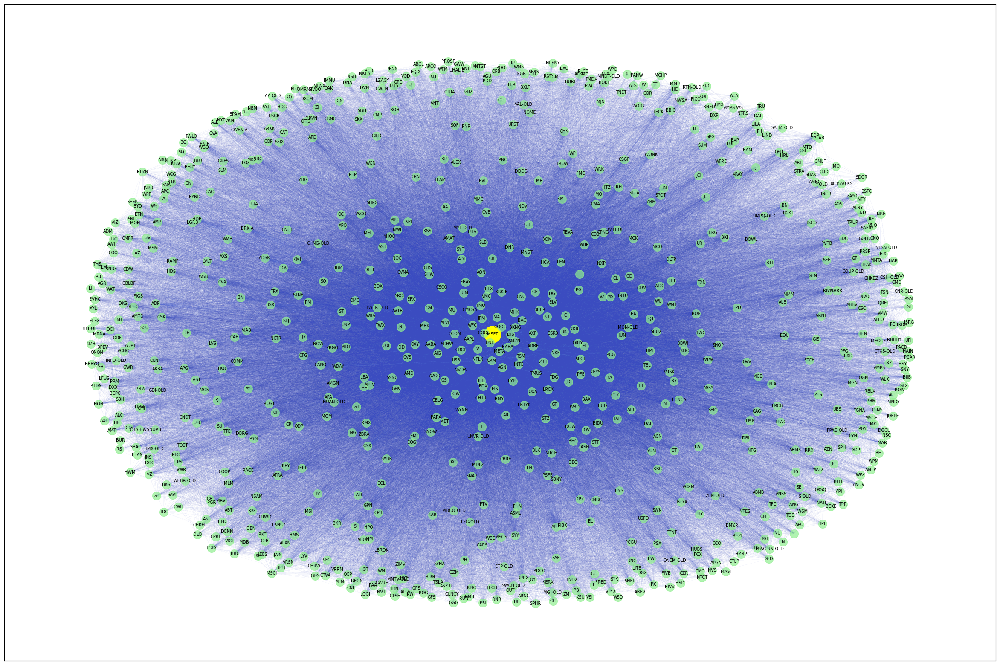

In [18]:
ego_node = 'MSFT'
ego_network = nx.ego_graph(stock_projection, ego_node)
pos = nx.spring_layout(ego_network, k=2)

plt.figure(figsize=(30, 20))

nx.draw_networkx_nodes(
    ego_network, 
    pos,
    nodelist=[ego_node],
    node_color='yellow', 
    node_size=800
)

nx.draw_networkx_nodes(
    ego_network, 
    pos,
    nodelist=[node for node in ego_network.nodes if node != ego_node],
    node_color='lightgreen', 
    node_size=200,
    alpha=0.7
)

#edges = [(u, v, data) for u, v, data in ego_network.edges(data=True) if data['weight'] > 2]
edges = ego_network.edges(data=True)

nx.draw_networkx_edges(
    ego_network, 
    pos, 
    width=[(data['weight'])*0.05 for _, _, data in edges], 
    edge_color = [data['weight'] for _, _, data in edges],
    edge_cmap = mpl.cm.coolwarm,
    alpha=0.6
    )

nx.draw_networkx_labels(ego_network, pos, font_size=7)

plt.savefig('ego_network_unipartite.png')

plt.show()

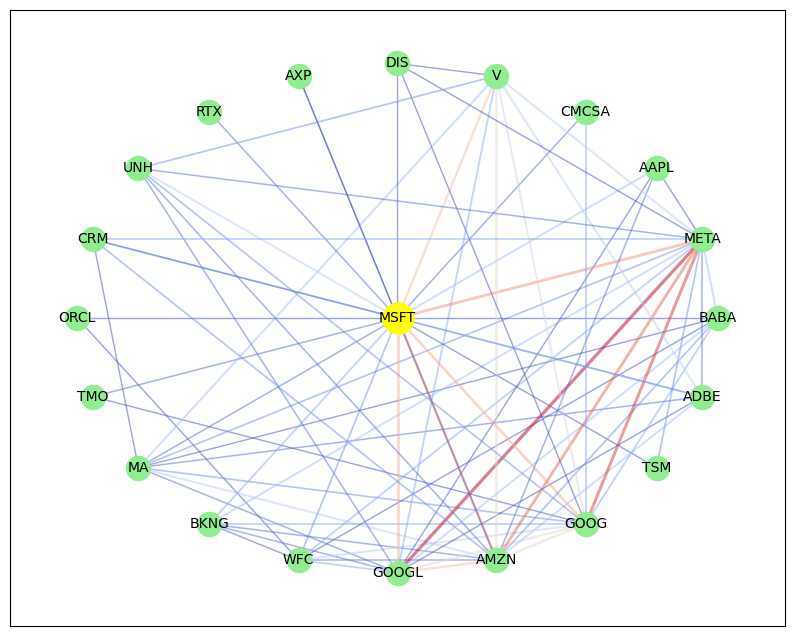

In [19]:
ego_node = 'MSFT'
ego_network = nx.ego_graph(stock_projection_filtered, ego_node)
#pos = nx.spring_layout(ego_network, k=0.5)
pos = nx.shell_layout(ego_network, nlist=[[ego_node], [node for node in ego_network.nodes if node != ego_node]])

plt.figure(figsize=(10, 8))

nx.draw_networkx_nodes(
    ego_network, 
    pos,
    nodelist=[ego_node],
    node_color='yellow', 
    node_size=500)

nx.draw_networkx_nodes(
    ego_network, 
    pos,
    nodelist=[node for node in ego_network.nodes if node != ego_node],
    node_color='lightgreen', 
    node_size=300)

edges = ego_network.edges(data=True)

nx.draw_networkx_edges(
    ego_network, 
    pos, 
    width=[(data['weight'])*0.1 for _, _, data in edges], 
    edge_color = [data['weight'] for _, _, data in edges],
    edge_cmap = mpl.cm.coolwarm,
    alpha=0.5
    )

nx.draw_networkx_labels(ego_network, pos, font_size=10)

plt.savefig('ego_network_unipartite_filtered.png')

plt.show()

# Task 3: Network Analysis

### Task 3.1 Network Statistics

#### Projection Network

In [20]:
output_dict = {}

for year in range(2016, 2024):
    if year == 2023:
        quarters = [1, 2]
    else:
        quarters = [1, 2, 3, 4]
        
    for quarter in quarters:
        file_name = f'{year}_Q{quarter}.xlsx'
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_excel(file_path, header=None)
        investor = df.columns[0]
        df_reshaped = df.melt(id_vars=[investor], value_name='stock')
        df_cleaned = df_reshaped.dropna(subset=['stock'])
        df_cleaned['quarter'] = f'{year}_Q{quarter}'
        df_cleaned.rename({0:'investor'}, axis=1, inplace=True)
        df_cleaned.drop('variable', axis=1, inplace=True)

        G = nx.Graph()
        investor_names = df_cleaned['investor'].unique()
        stock_names = df_cleaned['stock'].unique()
        G.add_nodes_from(investor_names, bipartite=0)
        G.add_nodes_from(stock_names, bipartite=1)

        for index, row in df_cleaned.iterrows():
            src = row['investor']
            tar = row['stock']
            if G.has_edge(src, tar):
                G[src][tar]['weight'] += 1
            else:
                G.add_edge(src, tar, weight=1)

        projection = bipartite.weighted_projected_graph(G, stock_names)
        degrees = [degree for _, degree in projection.degree()]
        weights = [data['weight'] for _, _, data in projection.edges(data=True)]
        
        output_dict[f'{year} Q{quarter}'] =  {
            'Number of nodes':len(projection.nodes()), 
            'Number of edges':len(projection.edges()), 
            'Density':nx.density(projection),
            'Avg clustering coefficient (unweighted)':nx.average_clustering(projection),
            'Avg clustering coefficient (weighted)':nx.average_clustering(projection, weight='weight'),
            'Avg degree':np.mean(degrees),
            'Avg strength':np.mean(weights),
            'Assortativity':nx.degree_assortativity_coefficient(projection)
        }

projection_statistics = pd.DataFrame(output_dict).T
print(f'Statistics for Projection Network:')
projection_statistics.describe().loc[['mean', 'max', 'min', 'std']].T

Statistics for Projection Network:


,mean,max,min,std
Number of nodes,586.900000,648.000000,496.000000,60.018589
Number of edges,8720.100000,9823.000000,6948.000000,1185.912375
Density,0.050898,0.057477,0.046225,0.003695
Avg clustering coefficient (unweighted),0.822469,0.840539,0.807782,0.007707
Avg clustering coefficient (weighted),0.102795,0.173978,0.056106,0.039911
Avg degree,29.612375,31.644013,27.422397,1.170293
Avg strength,1.104500,1.149068,1.060759,0.030039
Assortativity,-0.027235,0.023215,-0.067665,0.030889


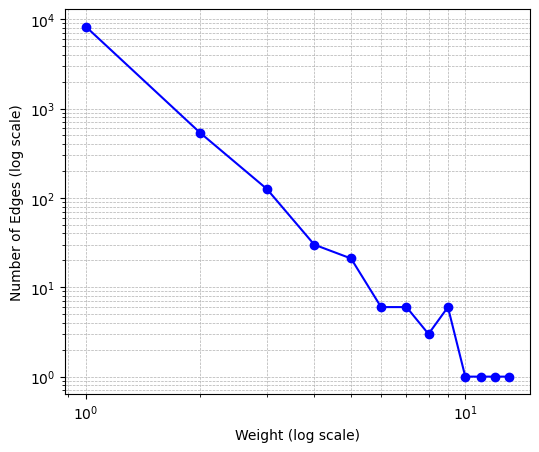

In [21]:
weight_counts = Counter(weights)

weight_count_df = pd.DataFrame(list(weight_counts.items()), columns=['Weight', 'Count'])
weight_count_df = weight_count_df.sort_values(by='Weight')

plt.figure(figsize=(6, 5))
plt.plot(weight_count_df['Weight'], weight_count_df['Count'], linestyle='-', marker='o', color='b')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Weight (log scale)')
plt.ylabel('Number of Edges (log scale)')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.savefig('weight_distribution.png')
plt.show()

#### Ego Network

In [22]:
output_dict = {}

for year in range(2016, 2024):
    if year == 2023:
        quarters = [1, 2]
    else:
        quarters = [1, 2, 3, 4]
        
    for quarter in quarters:
        file_name = f'{year}_Q{quarter}.xlsx'
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_excel(file_path, header=None)
        investor = df.columns[0]
        df_reshaped = df.melt(id_vars=[investor], value_name='stock')
        df_cleaned = df_reshaped.dropna(subset=['stock'])
        df_cleaned['quarter'] = f'{year}_Q{quarter}'
        df_cleaned.rename({0:'investor'}, axis=1, inplace=True)
        df_cleaned.drop('variable', axis=1, inplace=True)

        G = nx.Graph()
        investor_names = df_cleaned['investor'].unique()
        stock_names = df_cleaned['stock'].unique()
        G.add_nodes_from(investor_names, bipartite=0)
        G.add_nodes_from(stock_names, bipartite=1)

        for index, row in df_cleaned.iterrows():
            src = row['investor']
            tar = row['stock']
            if G.has_edge(src, tar):
                G[src][tar]['weight'] += 1
            else:
                G.add_edge(src, tar, weight=1)

        projection = bipartite.weighted_projected_graph(G, stock_names)
        ego_network = nx.ego_graph(projection, 'MSFT')
        degrees = [degree for _, degree in ego_network.degree()]
        weights = [data['weight'] for _, _, data in ego_network.edges(data=True)]
        
        output_dict[f'{year} Q{quarter}'] =  {
            'Number of nodes':len(ego_network.nodes()), 
            'Number of edges':len(ego_network.edges()), 
            'Density':nx.density(ego_network),
            'Avg clustering coefficient (unweighted)':nx.average_clustering(ego_network),
            'Avg clustering coefficient (weighted)':nx.average_clustering(ego_network, weight='weight'),
            'Avg degree':np.mean(degrees),
            'Avg strength':np.mean(weights),
            'Assortativity':nx.degree_assortativity_coefficient(ego_network)
        }

ego_statistics = pd.DataFrame(output_dict).T
print(f'Statistics for Ego Network:')
ego_statistics.describe().loc[['mean', 'max', 'min', 'std']].T

Statistics for Ego Network:


,mean,max,min,std
Number of nodes,187.966667,240.000000,104.000000,43.302850
Number of edges,2998.933333,4100.000000,1305.000000,960.823603
Density,0.172250,0.243652,0.135553,0.026595
Avg clustering coefficient (unweighted),0.772043,0.825745,0.733927,0.022831
Avg clustering coefficient (weighted),0.105001,0.178245,0.057940,0.039548
Avg degree,31.171154,36.127273,25.096154,3.693674
Avg strength,1.229763,1.317723,1.129863,0.061337
Assortativity,-0.118513,-0.047517,-0.176956,0.046095


# Task 4: Changes of Network Statistics During Pandemic

### Task 4.1: Temporal Evolution of Statistics

In [23]:
statistics = ['Number of nodes', 'Number of edges', 'Density', 'Avg clustering coefficient (unweighted)', 'Avg degree', 'Avg strength', 'Assortativity']

#### Number of nodes

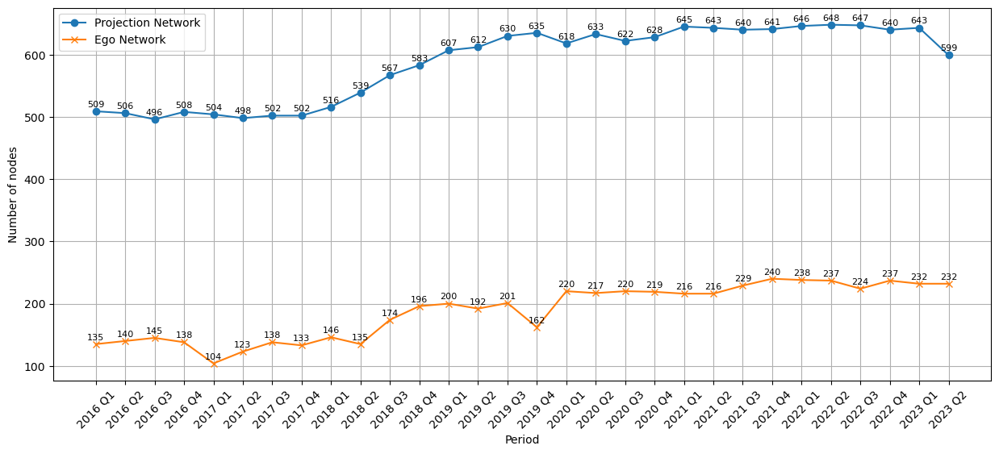

In [24]:
plt.figure(figsize=(15, 6))
plt.plot(projection_statistics.index, projection_statistics['Number of nodes'], label='Projection Network', marker='o')
plt.plot(ego_statistics.index, ego_statistics['Number of nodes'], label='Ego Network', marker='x')
    
plt.xlabel('Period')
plt.ylabel('Number of nodes')
    
plt.xticks(rotation=45)
plt.legend()

for idx, row in projection_statistics.iterrows():
    plt.text(idx, row['Number of nodes']+7, f'{row['Number of nodes']:.0f}', fontsize=8, ha='center')

for idx, row in ego_statistics.iterrows():
    plt.text(idx, row['Number of nodes']+7, f'{row['Number of nodes']:.0f}', fontsize=8, ha='center')
    
plt.grid(True)
    
#plt.savefig('temporal_nodes.png')
plt.show()

#### Number of edges

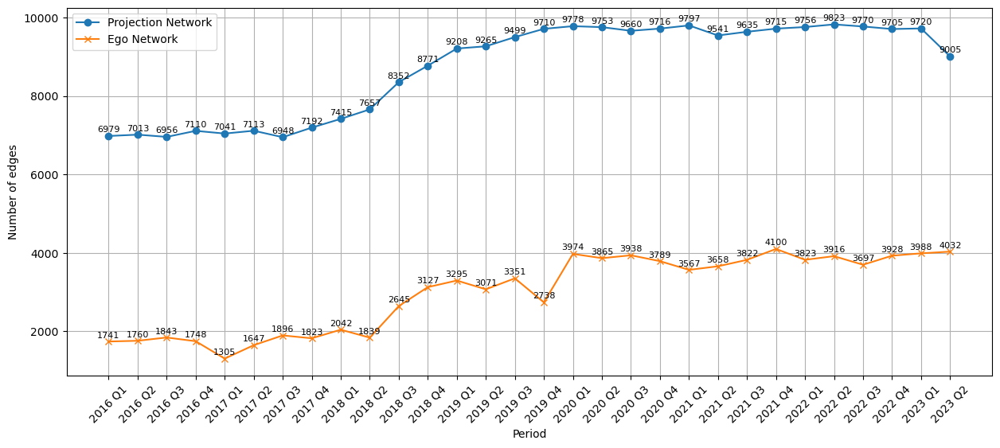

In [25]:
plt.figure(figsize=(15, 6))
plt.plot(projection_statistics.index, projection_statistics['Number of edges'], label='Projection Network', marker='o')
plt.plot(ego_statistics.index, ego_statistics['Number of edges'], label='Ego Network', marker='x')
    
plt.xlabel('Period')
plt.ylabel('Number of edges')
    
plt.xticks(rotation=45)
plt.legend()

for idx, row in projection_statistics.iterrows():
    plt.text(idx, row['Number of edges']+100, f'{row['Number of edges']:.0f}', fontsize=8, ha='center')

for idx, row in ego_statistics.iterrows():
    plt.text(idx, row['Number of edges']+100, f'{row['Number of edges']:.0f}', fontsize=8, ha='center')
    
plt.grid(True)
    
#plt.savefig('temporal_edges.png')
plt.show()

#### Density

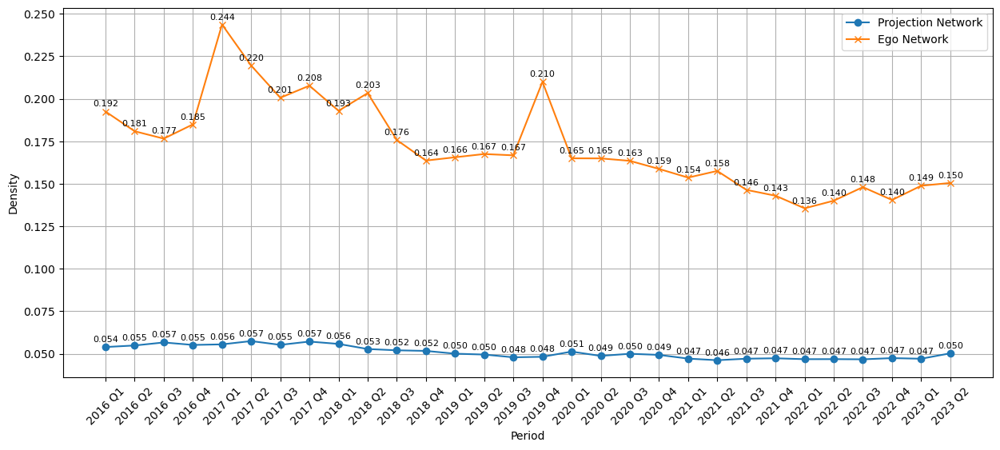

In [26]:
plt.figure(figsize=(15, 6))
plt.plot(projection_statistics.index, projection_statistics['Density'], label='Projection Network', marker='o')
plt.plot(ego_statistics.index, ego_statistics['Density'], label='Ego Network', marker='x')
    
plt.xlabel('Period')
plt.ylabel('Density')
    
plt.xticks(rotation=45)
plt.legend()

for idx, row in projection_statistics.iterrows():
    plt.text(idx, row['Density']+0.003, f'{row['Density']:.3f}', fontsize=8, ha='center')

for idx, row in ego_statistics.iterrows():
    plt.text(idx, row['Density']+0.003, f'{row['Density']:.3f}', fontsize=8, ha='center')
    
plt.grid(True)
    
#plt.savefig('temporal_density.png')
plt.show()

#### Avg Clustering Coefficient (Unweighted)

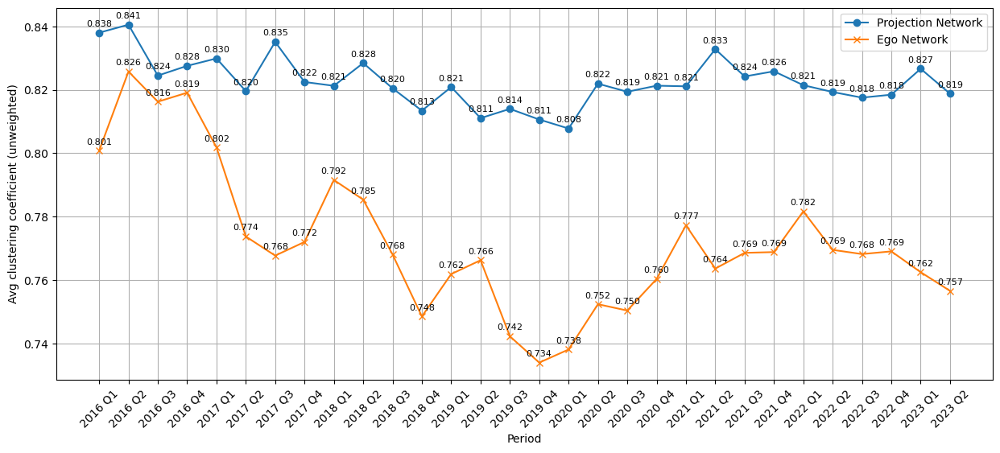

In [27]:
plt.figure(figsize=(15, 6))
plt.plot(projection_statistics.index, projection_statistics['Avg clustering coefficient (unweighted)'], label='Projection Network', marker='o')
plt.plot(ego_statistics.index, ego_statistics['Avg clustering coefficient (unweighted)'], label='Ego Network', marker='x')
    
plt.xlabel('Period')
plt.ylabel('Avg clustering coefficient (unweighted)')
    
plt.xticks(rotation=45)
plt.legend()

for idx, row in projection_statistics.iterrows():
    plt.text(idx, row['Avg clustering coefficient (unweighted)']+0.002, f'{row['Avg clustering coefficient (unweighted)']:.3f}', fontsize=8, ha='center')

for idx, row in ego_statistics.iterrows():
    plt.text(idx, row['Avg clustering coefficient (unweighted)']+0.002, f'{row['Avg clustering coefficient (unweighted)']:.3f}', fontsize=8, ha='center')
    
plt.grid(True)
    
#plt.savefig('temporal_cluster_coef.png')
plt.show()

#### Avg Degree

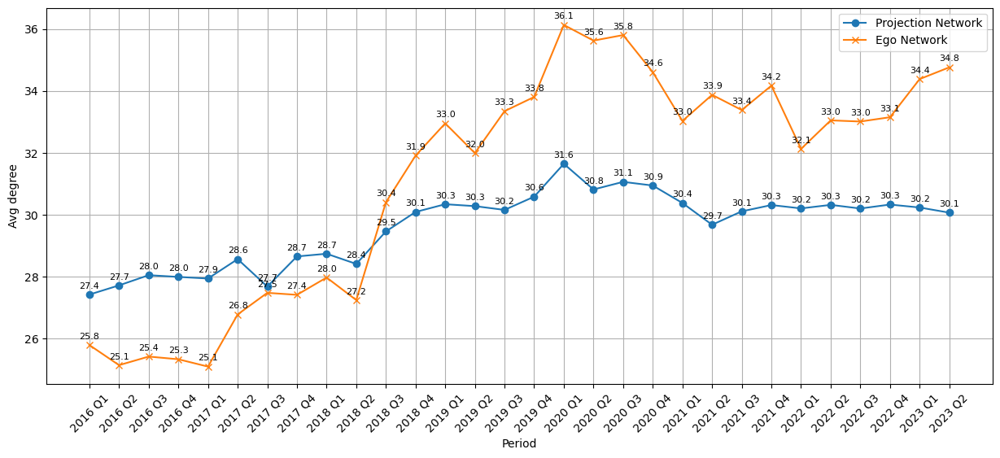

In [28]:
plt.figure(figsize=(15, 6))
plt.plot(projection_statistics.index, projection_statistics['Avg degree'], label='Projection Network', marker='o')
plt.plot(ego_statistics.index, ego_statistics['Avg degree'], label='Ego Network', marker='x')
    
plt.xlabel('Period')
plt.ylabel('Avg degree')
    
plt.xticks(rotation=45)
plt.legend()

for idx, row in projection_statistics.iterrows():
    plt.text(idx, row['Avg degree']+0.2, f'{row['Avg degree']:.1f}', fontsize=8, ha='center')

for idx, row in ego_statistics.iterrows():
    plt.text(idx, row['Avg degree']+0.2, f'{row['Avg degree']:.1f}', fontsize=8, ha='center')
    
plt.grid(True)
    
#plt.savefig('temporal_degree.png')
plt.show()

#### Avg Strength

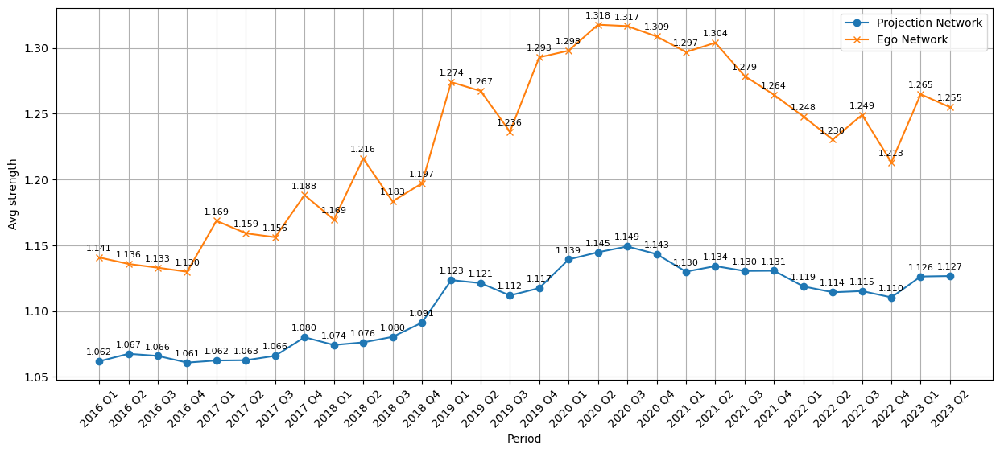

In [29]:
plt.figure(figsize=(15, 6))
plt.plot(projection_statistics.index, projection_statistics['Avg strength'], label='Projection Network', marker='o')
plt.plot(ego_statistics.index, ego_statistics['Avg strength'], label='Ego Network', marker='x')
    
plt.xlabel('Period')
plt.ylabel('Avg strength')
    
plt.xticks(rotation=45)
plt.legend()

for idx, row in projection_statistics.iterrows():
    plt.text(idx, row['Avg strength']+0.005, f'{row['Avg strength']:.3f}', fontsize=8, ha='center')

for idx, row in ego_statistics.iterrows():
    plt.text(idx, row['Avg strength']+0.005, f'{row['Avg strength']:.3f}', fontsize=8, ha='center')
    
plt.grid(True)
    
#plt.savefig('temporal_strength.png')
plt.show()

#### Assortativity

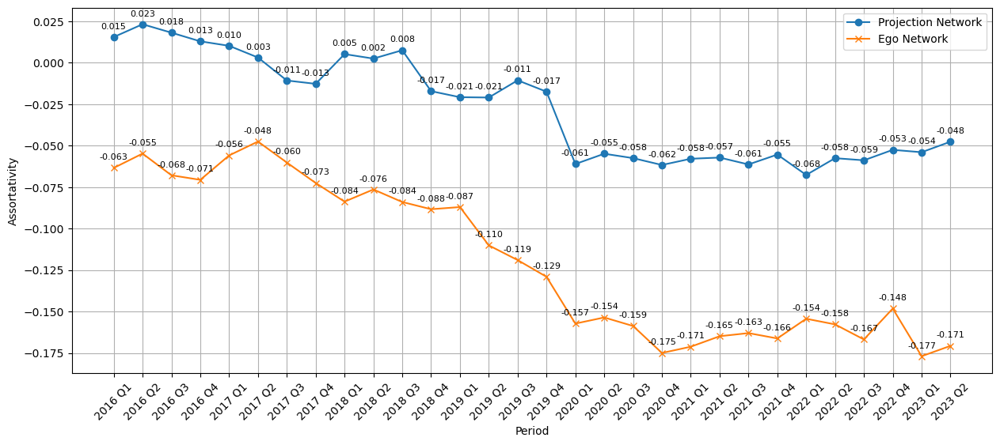

In [30]:
plt.figure(figsize=(15, 6))
plt.plot(projection_statistics.index, projection_statistics['Assortativity'], label='Projection Network', marker='o')
plt.plot(ego_statistics.index, ego_statistics['Assortativity'], label='Ego Network', marker='x')
    
plt.xlabel('Period')
plt.ylabel('Assortativity')
    
plt.xticks(rotation=45)
plt.legend()

for idx, row in projection_statistics.iterrows():
    plt.text(idx, row['Assortativity']+0.005, f'{row['Assortativity']:.3f}', fontsize=8, ha='center')

for idx, row in ego_statistics.iterrows():
    plt.text(idx, row['Assortativity']+0.005, f'{row['Assortativity']:.3f}', fontsize=8, ha='center')
    
plt.grid(True)
    
#plt.savefig('temporal_assortativity.png')
plt.show()

### Task 4.2: Centrality

In [31]:
top1 = {}
top2 = {}
top3 = {}
msft = {}

for year in range(2016, 2024):
    if year == 2023:
        quarters = [1, 2]
    else:
        quarters = [1, 2, 3, 4]
        
    for quarter in quarters:
        file_name = f'{year}_Q{quarter}.xlsx'
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_excel(file_path, header=None)
        investor = df.columns[0]
        df_reshaped = df.melt(id_vars=[investor], value_name='stock')
        df_cleaned = df_reshaped.dropna(subset=['stock'])
        df_cleaned['quarter'] = f'{year}_Q{quarter}'
        df_cleaned.rename({0:'investor'}, axis=1, inplace=True)
        df_cleaned.drop('variable', axis=1, inplace=True)

        G = nx.Graph()
        investor_names = df_cleaned['investor'].unique()
        stock_names = df_cleaned['stock'].unique()
        G.add_nodes_from(investor_names, bipartite=0)
        G.add_nodes_from(stock_names, bipartite=1)

        for index, row in df_cleaned.iterrows():
            src = row['investor']
            tar = row['stock']
            if G.has_edge(src, tar):
                G[src][tar]['weight'] += 1
            else:
                G.add_edge(src, tar, weight=1)

        projection = bipartite.weighted_projected_graph(G, stock_names)
        centrality = dict(nx.eigenvector_centrality(projection, weight='weight'))
        centrality = sorted(centrality.items(), key=lambda x: x[1], reverse=True)
        top1[f'{year} Q{quarter}'] = centrality[0]
        top2[f'{year} Q{quarter}'] = centrality[1]
        top3[f'{year} Q{quarter}'] = centrality[2]
        msft[f'{year} Q{quarter}'] = dict(centrality)['MSFT']

In [32]:
df_msft = pd.DataFrame(list(msft.items()), columns=['quarter', 'msft_centrality'])
df_top1 = pd.DataFrame(list(top1.items()), columns=['quarter', 'top1_centrality'])
df_top2 = pd.DataFrame(list(top2.items()), columns=['quarter', 'top2_centrality'])
df_top3 = pd.DataFrame(list(top3.items()), columns=['quarter', 'top3_centrality'])

df_top1['top1_node'] = df_top1['top1_centrality'].apply(lambda x: x[0])
df_top1['top1_centrality'] = df_top1['top1_centrality'].apply(lambda x: x[1])

df_top2['top2_node'] = df_top2['top2_centrality'].apply(lambda x: x[0])
df_top2['top2_centrality'] = df_top2['top2_centrality'].apply(lambda x: x[1])

df_top3['top3_node'] = df_top3['top3_centrality'].apply(lambda x: x[0])
df_top3['top3_centrality'] = df_top3['top3_centrality'].apply(lambda x: x[1])

df_merged = df_msft.merge(df_top1, on='quarter')
df_merged = df_merged.merge(df_top2, on='quarter')
df_merged = df_merged.merge(df_top3, on='quarter')

In [33]:
df_merged

,quarter,msft_centrality,top1_centrality,top1_node,top2_centrality,top2_node,top3_centrality,top3_node
0,2016 Q1,0.190274,0.228253,BAC,0.220792,GOOG,0.198705,BRK.B
1,2016 Q2,0.161356,0.223630,BRK.B,0.219129,WFC,0.218747,BAC
2,2016 Q3,0.192136,0.247579,WFC,0.218467,BAC,0.192136,MSFT
3,2016 Q4,0.171589,0.254410,BAC,0.249934,WFC,0.205341,BRK.B
4,2017 Q1,0.147868,0.266002,WFC,0.253740,BAC,0.221175,BRK.B
5,2017 Q2,0.162203,0.259532,WFC,0.247162,BAC,0.220966,BRK.B
6,2017 Q3,0.182545,0.256302,GOOG,0.248233,BAC,0.243274,WFC
7,2017 Q4,0.163842,0.300912,GOOG,0.264350,WFC,0.219646,BRK.B
8,2018 Q1,0.199995,0.312613,GOOG,0.218529,BAC,0.204611,WFC
9,2018 Q2,0.166906,0.325107,GOOG,0.253390,META,0.224695,WFC


In [34]:
df_edit = df_merged[['quarter', 'top1_centrality', 'top1_node', 'top2_centrality', 'top2_node', 'top3_centrality', 'top3_node']]
df_edit.to_csv('top_stocks.csv')

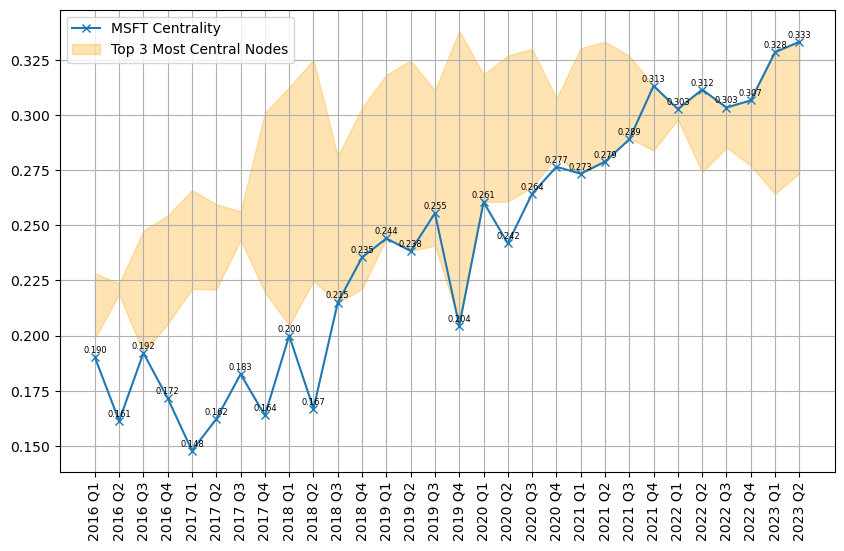

In [35]:
plt.figure(figsize=(10,6))
plt.plot(df_merged['quarter'], df_merged['msft_centrality'], label='MSFT Centrality', marker='x')
plt.fill_between(df_merged['quarter'], df_merged['top1_centrality'], df_merged['top3_centrality'], label='Top 3 Most Central Nodes', color='orange', alpha=0.3)

for i, value in enumerate(df_merged['msft_centrality']):
    plt.text(df_merged['quarter'][i], value + 0.002, f'{value:.3f}', fontsize=6, ha='center')

plt.xticks(rotation=90)
plt.grid()
plt.legend()
plt.savefig('eigenvector_centrality.png')
plt.show()

# Task 5: Clustering and Modularity

In [36]:
community_count = {}
modularities = {}

msft_communities = {}
count_stocks = {}
stock_counter = {}

for year in range(2016, 2024):
    if year == 2023:
        quarters = [1, 2]
    else:
        quarters = [1, 2, 3, 4]
        
    for quarter in quarters:
        file_name = f'{year}_Q{quarter}.xlsx'
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_excel(file_path, header=None)
        investor = df.columns[0]
        df_reshaped = df.melt(id_vars=[investor], value_name='stock')
        df_cleaned = df_reshaped.dropna(subset=['stock'])
        df_cleaned['quarter'] = f'{year}_Q{quarter}'
        df_cleaned.rename({0:'investor'}, axis=1, inplace=True)
        df_cleaned.drop('variable', axis=1, inplace=True)

        G = nx.Graph()
        investor_names = df_cleaned['investor'].unique()
        stock_names = df_cleaned['stock'].unique()
        G.add_nodes_from(investor_names, bipartite=0)
        G.add_nodes_from(stock_names, bipartite=1)

        for index, row in df_cleaned.iterrows():
            src = row['investor']
            tar = row['stock']
            if G.has_edge(src, tar):
                G[src][tar]['weight'] += 1
            else:
                G.add_edge(src, tar, weight=1)

        projection = bipartite.weighted_projected_graph(G, stock_names)
        louvain_partitions = nx.algorithms.community.louvain_communities(projection, seed=42)

        num_communities = len(louvain_partitions)
        modularity = nx.community.quality.modularity(projection, louvain_partitions, weight='weight')

        # Focus on MSFT community    
        msft_community = next(community for community in louvain_partitions if 'MSFT' in community)

        for stock in msft_community:
            if stock != 'MSFT':
                if stock in stock_counter.keys():
                    stock_counter[stock] += 1
                else:
                    stock_counter[stock] = 1
                
        members = len(msft_community)
        
        community_count[f'{year} Q{quarter}'] = num_communities
        msft_communities[f'{year} Q{quarter}'] = msft_community
        modularities[f'{year} Q{quarter}'] = modularity
        count_stocks[f'{year} Q{quarter}'] = members
        
        print(f'Q{quarter} {year}:')
        print(f'Number of Communities in Best Partition = {num_communities}')
        print(f'Modularity = {modularity:.4f}')
        print(f'Number of Stocks in MSFT Community = {members}')
        print(f'MSFT Community = {msft_community}\n')


Q1 2016:
Number of Communities in Best Partition = 11
Modularity = 0.5084
Number of Stocks in MSFT Community = 46
MSFT Community = {'NTRS', 'TMO', 'TWC', 'AMBC', 'BBBYQ', 'MOS', 'AFL', 'ZBH', 'LMT', 'LH', 'FAF', 'BNED', 'WU', 'IPG', 'MSFT', 'SJM', 'OMC', 'INXN', 'BEN', 'ITW', 'VIAB', 'KMT', 'CBS', 'BWA', 'ENT', 'NSAM', 'PGR', 'GOLD', 'BKS', 'KKR', 'CCO', 'LAZ', 'MAT', 'IBM', 'NOV', 'OPB', 'NRF', 'VTOL', 'MS', 'XOM', 'OXSQ', 'GS', 'JPM', 'MGI-OLD', 'SWK', 'VEON'}

Q2 2016:
Number of Communities in Best Partition = 11
Modularity = 0.5171
Number of Stocks in MSFT Community = 28
MSFT Community = {'RYN', 'AWI', 'OAK', 'BOH', 'GIL', 'AFIIQ', 'BHI', 'ALSN', 'ALEX', 'NVDA', 'TRMB', 'TTE', 'XYL', 'FRED', 'STX', 'CELG', 'MSCI', 'PLCE', 'BCR', 'MSFT', 'BFH', 'NEM', 'QCOM', 'VRNT', 'TRN', 'EOG', 'CACI', 'CFG'}

Q3 2016:
Number of Communities in Best Partition = 11
Modularity = 0.5070
Number of Stocks in MSFT Community = 70
MSFT Community = {'NTRS', 'PH', 'PG', 'DVA', 'HPQ', 'LMT', 'LH', 'FAF', 'WU

### Plotting

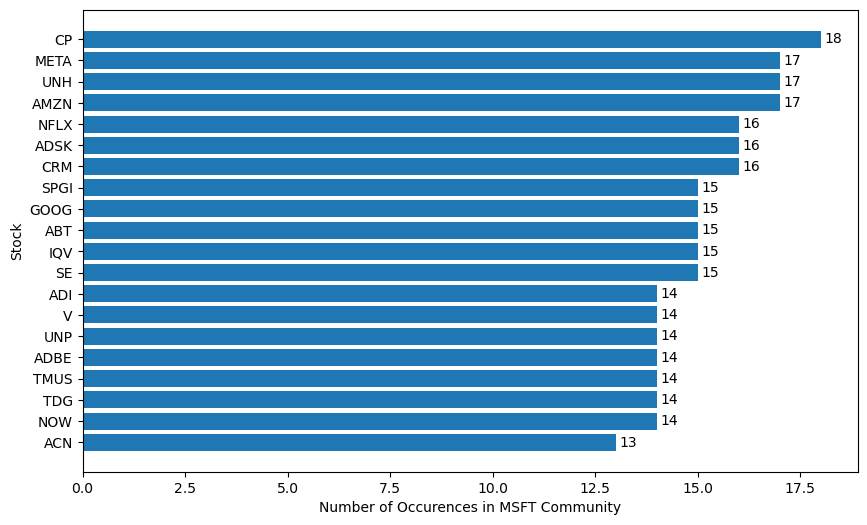

In [37]:
# Number of Stock Occurences (Top 20)
stock_counter_sorted = sorted(stock_counter.items(), key=lambda x: x[1], reverse=True)
df_stock_counter = pd.DataFrame(stock_counter_sorted, columns=['stock', 'count'])
df_filtered = df_stock_counter.head(20)

plt.figure(figsize=(10, 6))
bars = plt.barh(df_filtered['stock'], df_filtered['count'])
plt.xlabel('Number of Occurences in MSFT Community')
plt.ylabel('Stock')
plt.gca().invert_yaxis()

for bar in bars:
    width = bar.get_width()
    plt.text(
        bar.get_width()+0.1, 
        (bar.get_y()+bar.get_height()/2),
        f'{bar.get_width():.0f}',
        va='center'
    )


plt.show()

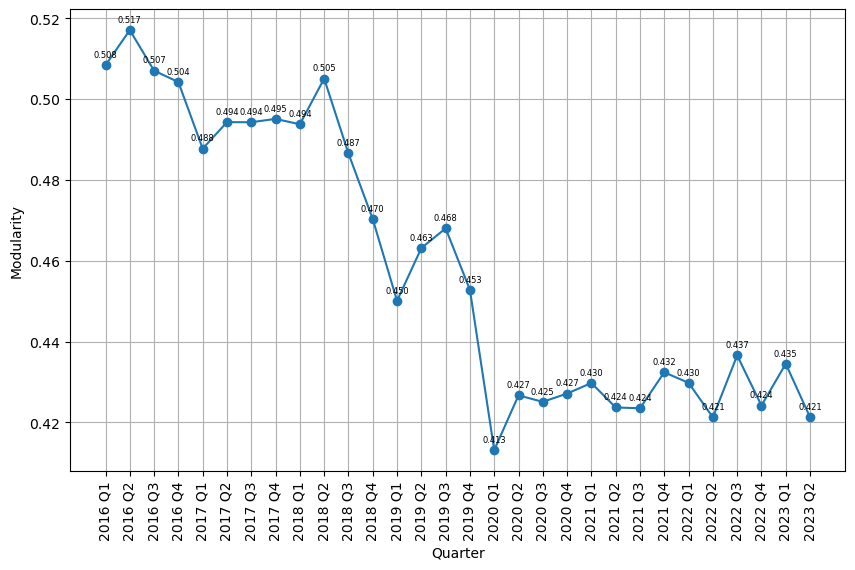

In [38]:
# Modularities Over Time
df_mod = pd.DataFrame(list(modularities.items()), columns=['quarter', 'modularity'])

plt.figure(figsize=(10,6))
plt.plot(df_mod['quarter'], df_mod['modularity'], marker='o')
plt.grid()
plt.xlabel('Quarter')
plt.ylabel('Modularity')
plt.xticks(rotation=90)

for i, value in enumerate(df_mod['modularity']):
    plt.text(
        df_mod['quarter'][i], 
        value + 0.002, 
        f'{value:.3f}', 
        fontsize=6, 
        ha='center'
    )

plt.savefig('modularities_over_time.png')
plt.show()

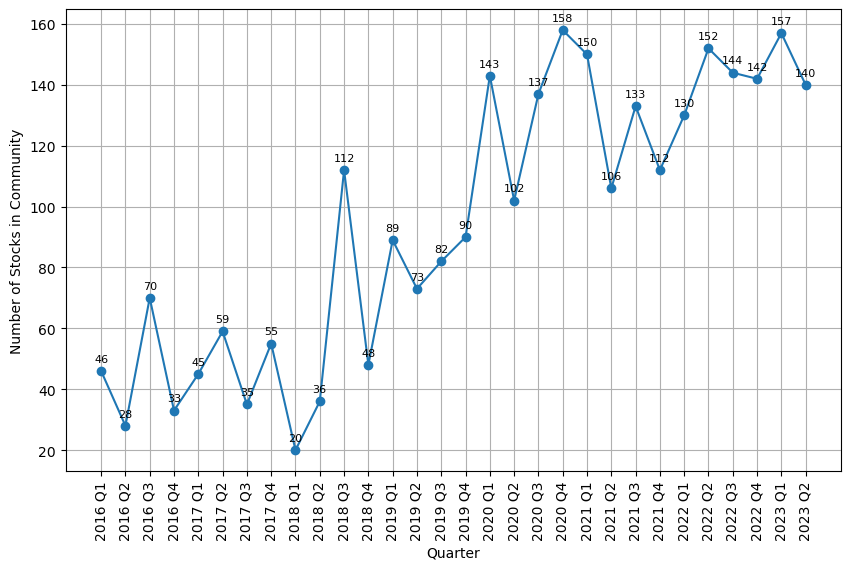

In [39]:
# Number of Stocks in Community Over Time
df_members = pd.DataFrame(list(count_stocks.items()), columns=['quarter', 'members'])

plt.figure(figsize=(10,6))
plt.plot(df_members['quarter'], df_members['members'], marker='o')
plt.grid()
plt.xlabel('Quarter')
plt.ylabel('Number of Stocks in Community')
plt.xticks(rotation=90)

for i, value in enumerate(df_members['members']):
    plt.text(
        df_members['quarter'][i], 
        value + 3, 
        f'{value:.0f}', 
        fontsize=8, 
        ha='center'
    )

plt.savefig('no_of_stocks_overtime.png')
plt.show()

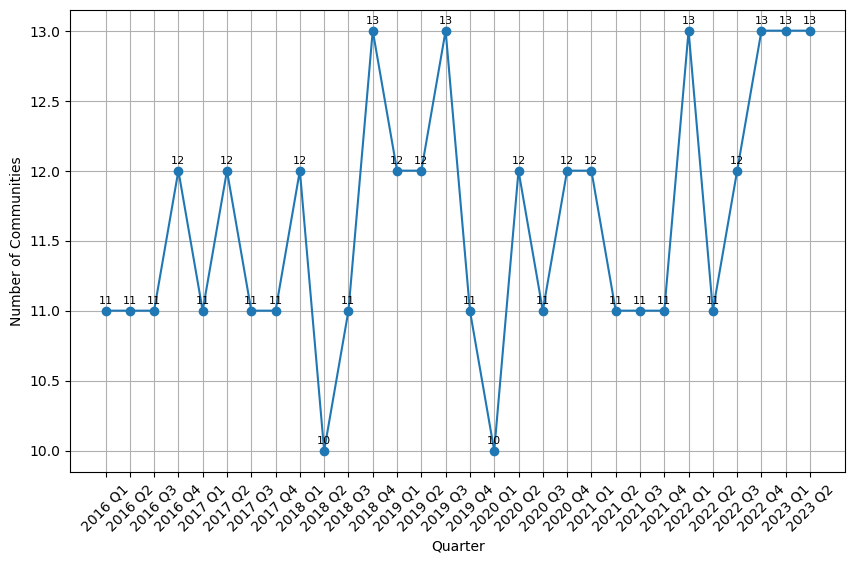

In [40]:
# Number of Communities Over Time
df_comm = pd.DataFrame(list(community_count.items()), columns=['quarter', 'comm'])

plt.figure(figsize=(10,6))
plt.plot(df_comm['quarter'], df_comm['comm'], marker='o')
plt.grid()
plt.xlabel('Quarter')
plt.ylabel('Number of Communities')
plt.xticks(rotation=45)

for i, value in enumerate(df_comm['comm']):
    plt.text(
        df_comm['quarter'][i], 
        value + 0.05, 
        f'{value:.0f}', 
        fontsize=8, 
        ha='center'
    )

plt.show()

#### Plot MSFT Communities Over Time

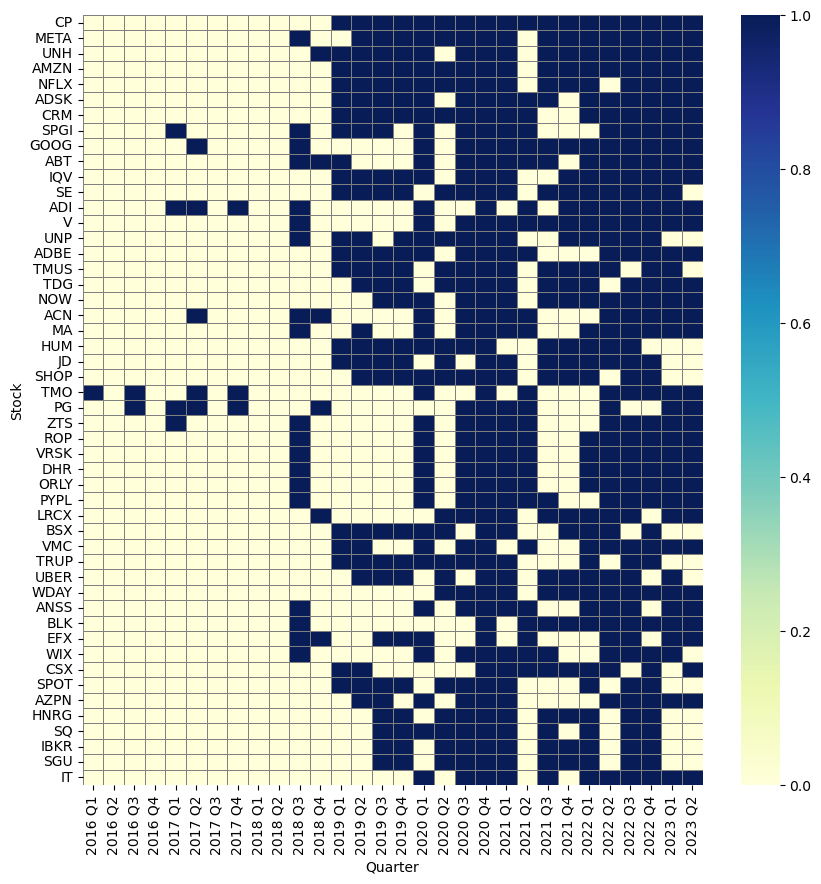

In [41]:
stock_counter_sorted = sorted(stock_counter.items(), key=lambda x: x[1], reverse=True)
df_stock_counter = pd.DataFrame(stock_counter_sorted, columns=['stock', 'count'])
df_filtered = df_stock_counter.head(50)
top_stocks = df_filtered['stock'].tolist()

quarters = sorted(msft_communities.keys())
membership_df_top = pd.DataFrame(0, index=top_stocks, columns=quarters)

for quarter, community in msft_communities.items():
    for stock in community:
        if stock in top_stocks:
            membership_df_top.loc[stock, quarter] = 1

plt.figure(figsize=(10,10))
sns.heatmap(membership_df_top, cmap='YlGnBu', cbar=True, linewidths=0.5, linecolor='grey')
plt.xlabel("Quarter")
plt.ylabel("Stock")
plt.xticks(rotation=90)
plt.savefig('msft_communities.png')
plt.show()


# Task 6: Analysing Stock Correlation Through a Spanning Tree

### Task 6.1: Contruct a Stock Correlation Network

In [ ]:
# Load Data
df = pd.read_csv('dataset/Stock_Prices/stock_prices.csv', parse_dates=['Date'], index_col='Date')
monthly_prices = df.resample('ME').last()
monthly_returns = monthly_prices.pct_change().dropna()

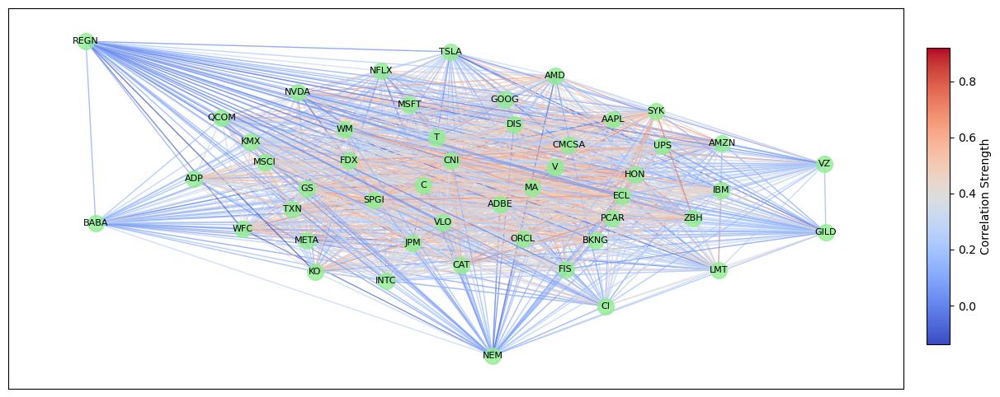

In [43]:

df_corr = monthly_returns.corr()

stock_graph = nx.Graph()
stock_graph.add_nodes_from(df_corr.columns)

for i in df_corr.columns:
    for j in df_corr.columns:
        if i < j: 
            stock_graph.add_edge(i, j, weight=df_corr.loc[i, j])

fig, ax = plt.subplots(figsize=(14, 6))
pos = nx.spring_layout(stock_graph, k=0.5)

nx.draw_networkx_nodes(
    stock_graph, 
    pos, 
    ax=ax,
    node_size=200, 
    node_color='lightgreen', 
    alpha=0.8
)

edges = stock_graph.edges(data=True)
edge_weights = [data['weight'] for _, _, data in edges]

norm = mpl.colors.Normalize(vmin=min(edge_weights), vmax=max(edge_weights))
cmap = mpl.cm.coolwarm

nx.draw_networkx_edges(
    stock_graph, 
    pos, 
    ax=ax,
    edgelist=edges, 
    edge_color=edge_weights,
    edge_cmap=cmap,
    edge_vmin=min(edge_weights),
    edge_vmax=max(edge_weights),
    alpha=0.7
)

nx.draw_networkx_labels(
    stock_graph, 
    pos, 
    ax=ax,
    font_size=8, 
    font_color='black'
)

cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(edge_weights)
fig.colorbar(sm, cax=cax, label="Correlation Strength")

plt.savefig('stock_prices_graph.png')
plt.show()


In [44]:
deg = [degree for _, degree in stock_graph.degree()]
wgt = [data['weight'] for _, _, data in stock_graph.edges(data=True)]

stock_graph_dict = {'Number of nodes':len(stock_graph.nodes()), 
'Number of edges':len(stock_graph.edges())}

stock_graph_dict

{'Number of nodes': 49, 'Number of edges': 1176}

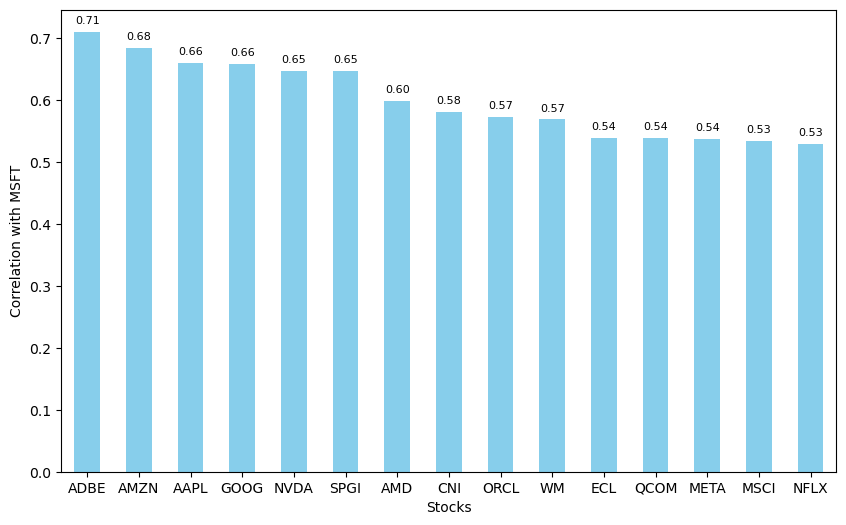

In [45]:
top_n = 15
most_correlated_with_msft = df_corr['MSFT'].sort_values(ascending=False).drop('MSFT').head(top_n)

plt.figure(figsize=(10, 6))
most_correlated_with_msft.plot(kind='bar', color='skyblue')
plt.xlabel("Stocks")
plt.xticks(rotation=0)
plt.ylabel("Correlation with MSFT")

for index, value in enumerate(most_correlated_with_msft):
    plt.text(index, value + 0.01, f"{value:.2f}", ha='center', va='bottom', fontsize=8)

plt.savefig('MSFT_correlations.png')
plt.show()

### Task 6.2: Build a Spanning Tree

#### Overall Network

In [46]:
df_dist = np.sqrt(2*(1-df_corr))

stock_graph_dist = nx.Graph()
stock_graph_dist.add_nodes_from(df_dist.columns)

for i in df_dist.columns:
    for j in df_dist.index:
        if i < j:
            stock_graph_dist.add_edge(i, j, weight=df_dist.loc[i,j])

tree_min = nx.minimum_spanning_tree(stock_graph_dist)

degrees = dict(tree_min.degree())
max_degree_node = max(degrees, key=degrees.get)
max_degree = degrees[max_degree_node]

print(f'Highest Degree Node: {max_degree_node}, Degree:{max_degree}')
print(f'MSFT Degree: {tree_min.degree('MSFT')}')

Highest Degree Node: MSFT, Degree:8
MSFT Degree: 8


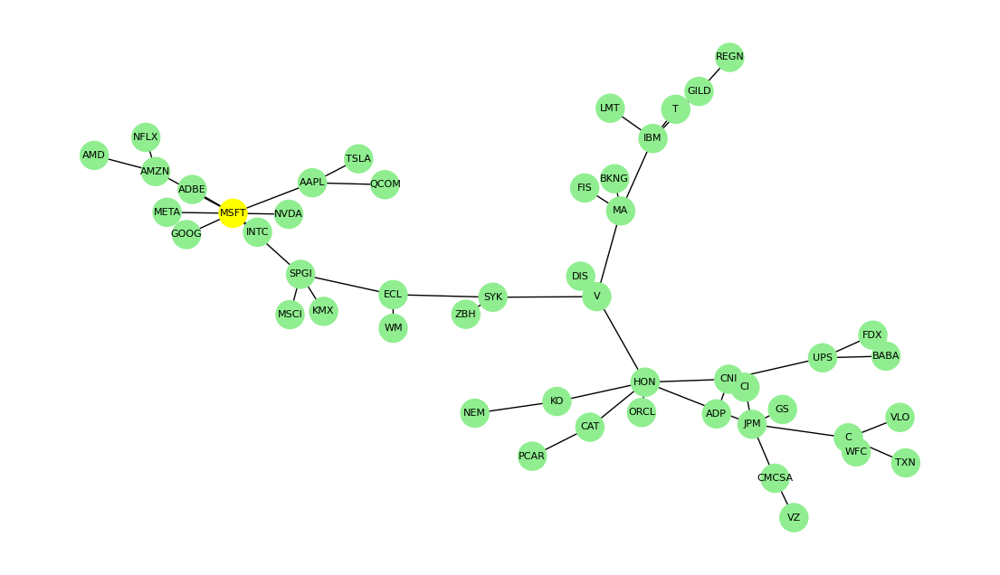

In [47]:
# Plotting
fig, ax = plt.subplots(figsize=(14, 8))

node_colors = ['lightgreen' if node != 'MSFT' else 'yellow' for node in tree_min.nodes()]

nx.draw(
    tree_min,
    ax=ax,
    pos = nx.spring_layout(tree_min, iterations = 500, k=1.5, weight = None),
    node_size = 500,
    node_color = node_colors,
    with_labels = True,
    font_color = 'black',
    font_size = 8
    )

#plt.savefig('spanning_tree_overall.png')
plt.show()

In [48]:
# Degree Centrality
degree_centrality = nx.degree_centrality(tree_min)

deg_centrality_data = {
    'Node': list(tree_min.nodes),
    'Degree Centrality': [degree_centrality[node] for node in tree_min.nodes],
}

deg_centrality_df = pd.DataFrame(deg_centrality_data)
deg_centrality_df = deg_centrality_df.sort_values(by='Degree Centrality', ascending=False)
deg_centrality_df.reset_index(drop=True, inplace=True)

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(tree_min, weight='weight')

bet_centrality_data = {
    'Node': list(tree_min.nodes),
    'Betweenness Centrality': [betweenness_centrality[node] for node in tree_min.nodes],
}

bet_centrality_df = pd.DataFrame(bet_centrality_data)
bet_centrality_df = bet_centrality_df.sort_values(by='Betweenness Centrality', ascending=False)
bet_centrality_df.reset_index(drop=True, inplace=True)

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(tree_min, distance='weight')

cl_centrality_data = {
    'Node': list(tree_min.nodes),
    'Closeness Centrality': [closeness_centrality[node] for node in tree_min.nodes]
}

cl_centrality_df = pd.DataFrame(cl_centrality_data)
cl_centrality_df = cl_centrality_df.sort_values(by='Closeness Centrality', ascending=False)
cl_centrality_df.reset_index(drop=True, inplace=True)

# Combine Dataframe
combined_df = pd.concat([deg_centrality_df, bet_centrality_df, cl_centrality_df], axis=1)
combined_df.columns = ['Node (Degree)', 'Degree Centrality', 'Node (Betweenness)', 'Betweenness Centrality', 'Node (Closeness)', 'Closeness Centrality']
combined_df.head(20)

,Node (Degree),Degree Centrality,Node (Betweenness),Betweenness Centrality,Node (Closeness),Closeness Centrality
0,MSFT,0.166667,V,0.655142,V,0.376827
1,HON,0.125000,HON,0.597518,HON,0.357473
2,JPM,0.104167,SYK,0.493794,SYK,0.353637
3,IBM,0.083333,ECL,0.467199,MA,0.341253
4,SPGI,0.083333,SPGI,0.444149,ECL,0.325874
5,C,0.083333,MSFT,0.404255,JPM,0.304898
6,V,0.083333,JPM,0.302305,SPGI,0.294943
7,MA,0.083333,MA,0.264184,CNI,0.290517
8,AAPL,0.062500,IBM,0.160461,DIS,0.288486
9,UPS,0.062500,CNI,0.158688,ZBH,0.282137


#### Before Pandemic (< March 2020)

In [49]:
df_before = df[(df.index < '2020-03')]
monthly_returns_before = df_before.resample('ME').last().pct_change().dropna()
df_corr_before = monthly_returns_before.corr()
df_dist_before = np.sqrt(2 * (1 - df_corr_before))

stock_graph_before = nx.Graph()
stock_graph_before.add_nodes_from(df_dist_before.columns)

for i in df_dist_before.columns:
    for j in df_dist_before.index:
        if i < j:
            stock_graph_before.add_edge(i, j, weight=df_dist_before.loc[i,j])

tree_min_before = nx.minimum_spanning_tree(stock_graph_before)

degrees = dict(tree_min_before.degree())
max_degree_node = max(degrees, key=degrees.get) # Get values from a dict
max_degree = degrees[max_degree_node]

print(f'Highest Degree Node: {max_degree_node}, Degree: {max_degree}')
print(f'MSFT Degree: {tree_min_before.degree('MSFT')}')

Highest Degree Node: C, Degree: 6
MSFT Degree: 4


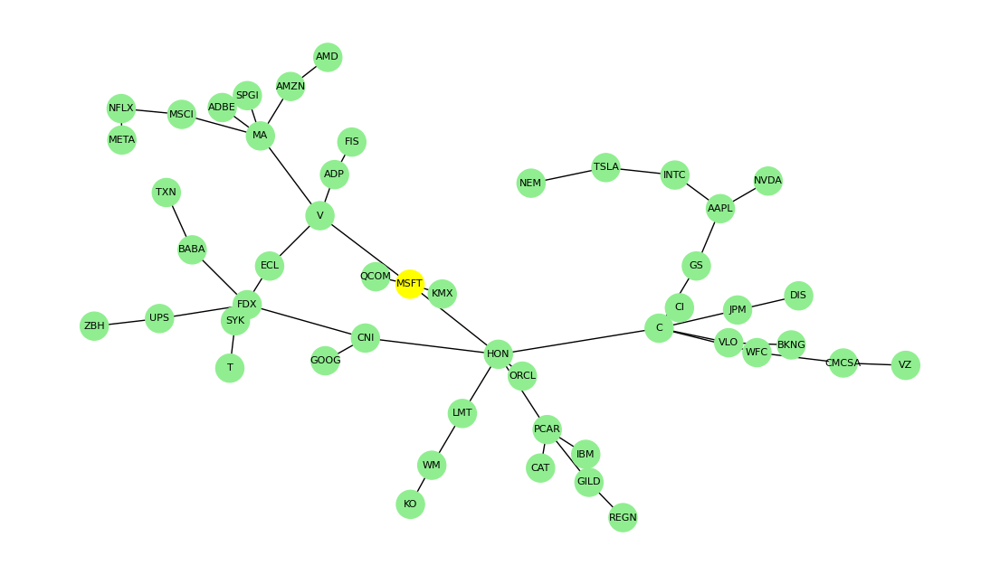

In [50]:
# Plotting
fig, ax = plt.subplots(figsize=(14, 8))

node_colors = ['lightgreen' if node != 'MSFT' else 'yellow' for node in tree_min.nodes()]

nx.draw(
    tree_min_before,
    ax=ax,
    pos = nx.spring_layout(tree_min_before, iterations = 500, k=1.5, weight = None),
    node_size = 500,
    node_color = node_colors,
    with_labels = True,
    font_color = 'black',
    font_size = 8
    )

plt.savefig('spanning_tree_before.png')
plt.show()

In [51]:
# Degree Centrality
degree_centrality = nx.degree_centrality(tree_min_before)

deg_centrality_data = {
    'Node': list(tree_min_before.nodes),
    'Degree Centrality': [degree_centrality[node] for node in tree_min_before.nodes],
}

deg_centrality_df = pd.DataFrame(deg_centrality_data)
deg_centrality_df = deg_centrality_df.sort_values(by='Degree Centrality', ascending=False)
deg_centrality_df.reset_index(drop=True, inplace=True)

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(tree_min_before, weight='weight')

bet_centrality_data = {
    'Node': list(tree_min_before.nodes),
    'Betweenness Centrality': [betweenness_centrality[node] for node in tree_min_before.nodes],
}

bet_centrality_df = pd.DataFrame(bet_centrality_data)
bet_centrality_df = bet_centrality_df.sort_values(by='Betweenness Centrality', ascending=False)
bet_centrality_df.reset_index(drop=True, inplace=True)

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(tree_min_before, distance='weight')

cl_centrality_data = {
    'Node': list(tree_min_before.nodes),
    'Closeness Centrality': [closeness_centrality[node] for node in tree_min_before.nodes]
}

cl_centrality_df = pd.DataFrame(cl_centrality_data)
cl_centrality_df = cl_centrality_df.sort_values(by='Closeness Centrality', ascending=False)
cl_centrality_df.reset_index(drop=True, inplace=True)

# Combine Dataframe
combined_df = pd.concat([deg_centrality_df, bet_centrality_df, cl_centrality_df], axis=1)
combined_df.columns = ['Node (Degree)', 'Degree Centrality', 'Node (Betweenness)', 'Betweenness Centrality', 'Node (Closeness)', 'Closeness Centrality']
combined_df.head(20)

,Node (Degree),Degree Centrality,Node (Betweenness),Betweenness Centrality,Node (Closeness),Closeness Centrality
0,C,0.125000,HON,0.756206,HON,0.510747
1,HON,0.125000,C,0.484929,MSFT,0.466195
2,MA,0.104167,MSFT,0.479610,C,0.456704
3,PCAR,0.083333,V,0.444149,V,0.422145
4,V,0.083333,MA,0.269504,CNI,0.417220
5,MSFT,0.083333,CNI,0.227837,PCAR,0.410950
6,CNI,0.062500,GS,0.190603,ORCL,0.401952
7,AAPL,0.062500,PCAR,0.160461,LMT,0.387446
8,FDX,0.062500,FDX,0.159574,JPM,0.377558
9,MSCI,0.041667,AAPL,0.158688,GS,0.376318


#### During Pandemic (March 2020 - March 2021)

In [52]:
df_during = df[(df.index >= '2020-03') & (df.index <= '2021-03')]
monthly_returns_during = df_during.resample('ME').last().pct_change().dropna()
df_corr_during = monthly_returns_during.corr()
df_dist_during = np.sqrt(2 * (1 - df_corr_during))

stock_graph_during = nx.Graph()
stock_graph_during.add_nodes_from(df_dist_during.columns)

for i in df_dist_during.columns:
    for j in df_dist_during.index:
        if i < j:
            stock_graph_during.add_edge(i, j, weight=df_dist_during.loc[i,j])

tree_min_during = nx.minimum_spanning_tree(stock_graph_during)

degrees = dict(tree_min_during.degree())
max_degree_node = max(degrees, key=degrees.get) # Get values from a dict
max_degree = degrees[max_degree_node]

print(f'Highest Degree Node: {max_degree_node}')
print(f'Degree: {max_degree}')

Highest Degree Node: CMCSA
Degree: 4


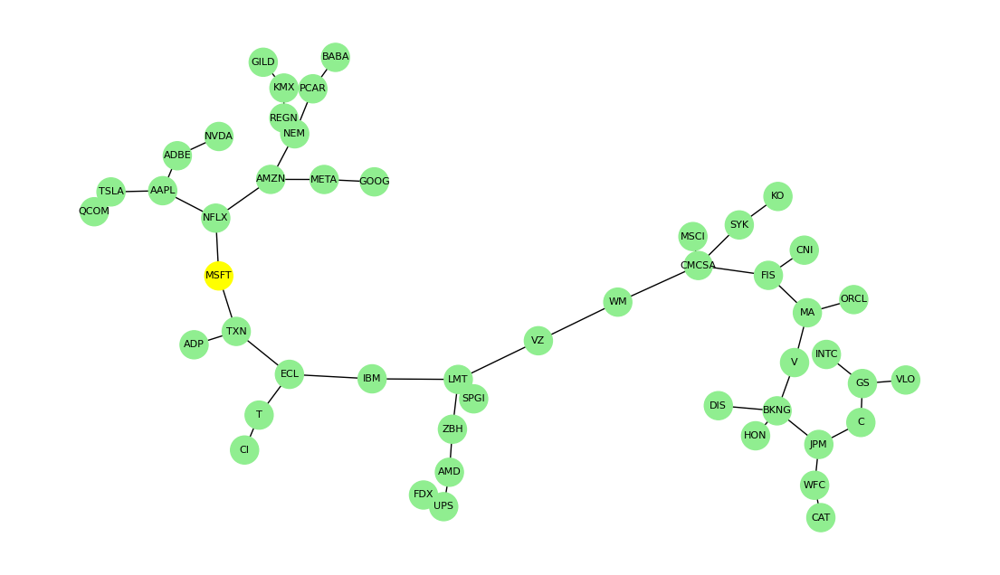

In [53]:
# Plotting
fig, ax = plt.subplots(figsize=(14, 8))

node_colors = ['lightgreen' if node != 'MSFT' else 'yellow' for node in tree_min.nodes()]

nx.draw(
    tree_min_during,
    ax=ax,
    pos = nx.spring_layout(tree_min_during, iterations = 500, k=1.5, weight = None),
    node_size = 500,
    node_color = node_colors,
    with_labels = True,
    font_color = 'black',
    font_size = 8
    )

plt.savefig('spanning_tree_during.png')
plt.show()

In [54]:
# Degree Centrality
degree_centrality = nx.degree_centrality(tree_min_during)

deg_centrality_data = {
    'Node': list(tree_min_during.nodes),
    'Degree Centrality': [degree_centrality[node] for node in tree_min_during.nodes],
}

deg_centrality_df = pd.DataFrame(deg_centrality_data)
deg_centrality_df = deg_centrality_df.sort_values(by='Degree Centrality', ascending=False)
deg_centrality_df.reset_index(drop=True, inplace=True)

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(tree_min_during, weight='weight')

bet_centrality_data = {
    'Node': list(tree_min_during.nodes),
    'Betweenness Centrality': [betweenness_centrality[node] for node in tree_min_during.nodes],
}

bet_centrality_df = pd.DataFrame(bet_centrality_data)
bet_centrality_df = bet_centrality_df.sort_values(by='Betweenness Centrality', ascending=False)
bet_centrality_df.reset_index(drop=True, inplace=True)

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(tree_min_during, distance='weight')

cl_centrality_data = {
    'Node': list(tree_min_during.nodes),
    'Closeness Centrality': [closeness_centrality[node] for node in tree_min_during.nodes]
}

cl_centrality_df = pd.DataFrame(cl_centrality_data)
cl_centrality_df = cl_centrality_df.sort_values(by='Closeness Centrality', ascending=False)
cl_centrality_df.reset_index(drop=True, inplace=True)

# Combine Dataframe
combined_df = pd.concat([deg_centrality_df, bet_centrality_df, cl_centrality_df], axis=1)
combined_df.columns = ['Node (Degree)', 'Degree Centrality', 'Node (Betweenness)', 'Betweenness Centrality', 'Node (Closeness)', 'Closeness Centrality']
combined_df.head(20)

,Node (Degree),Degree Centrality,Node (Betweenness),Betweenness Centrality,Node (Closeness),Closeness Centrality
0,LMT,0.083333,LMT,0.603723,LMT,0.327183
1,BKNG,0.083333,ECL,0.528369,IBM,0.322018
2,CMCSA,0.083333,CMCSA,0.520390,VZ,0.321471
3,JPM,0.062500,IBM,0.502660,ECL,0.314502
4,GS,0.062500,VZ,0.496454,WM,0.311937
5,KMX,0.062500,WM,0.488475,CMCSA,0.301053
6,MA,0.062500,TXN,0.481383,TXN,0.297696
7,FIS,0.062500,NFLX,0.461879,FIS,0.289416
8,TXN,0.062500,MSFT,0.438830,ZBH,0.285214
9,PCAR,0.062500,FIS,0.433511,SPGI,0.280590


#### After Pandemic (> March 2021)

In [55]:
df_after = df[(df.index > '2021-03')]
monthly_returns_after = df_after.resample('ME').last().pct_change().dropna()
df_corr_after = monthly_returns_after.corr()
df_dist_after = np.sqrt(2 * (1 - df_corr_after))

stock_graph_after = nx.Graph()
stock_graph_after.add_nodes_from(df_dist_after.columns)

for i in df_dist_after.columns:
    for j in df_dist_after.index:
        if i < j:
            stock_graph_after.add_edge(i, j, weight=df_dist_after.loc[i,j])

tree_min_after = nx.minimum_spanning_tree(stock_graph_after)

degrees = dict(tree_min_after.degree())
max_degree_node = max(degrees, key=degrees.get) # Get values from a dict
max_degree = degrees[max_degree_node]

print(f'Highest Degree Node: {max_degree_node}')
print(f'Degree: {max_degree}')

Highest Degree Node: CAT
Degree: 6


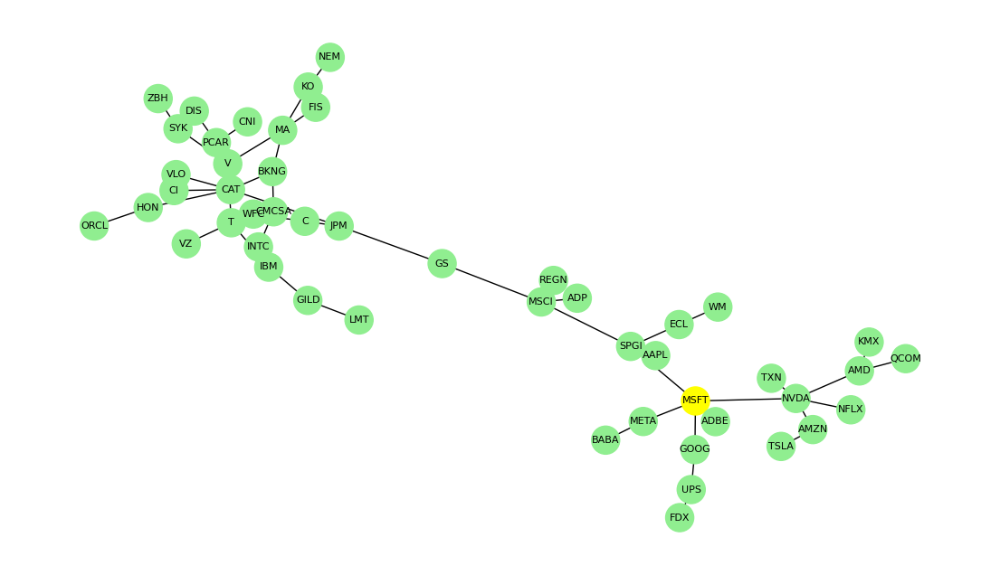

In [56]:
# Plotting
fig, ax = plt.subplots(figsize=(14, 8))

node_colors = ['lightgreen' if node != 'MSFT' else 'yellow' for node in tree_min.nodes()]

nx.draw(
    tree_min_after,
    ax=ax,
    pos = nx.spring_layout(tree_min_after, iterations = 500, k=1.5, weight = None),
    node_size = 500,
    node_color = node_colors,
    with_labels = True,
    font_color = 'black',
    font_size = 8
    )

plt.savefig('spanning_tree_after.png')
plt.show()

In [57]:
# Degree Centrality
degree_centrality = nx.degree_centrality(tree_min_after)

deg_centrality_data = {
    'Node': list(tree_min_after.nodes),
    'Degree Centrality': [degree_centrality[node] for node in tree_min_after.nodes],
}

deg_centrality_df = pd.DataFrame(deg_centrality_data)
deg_centrality_df = deg_centrality_df.sort_values(by='Degree Centrality', ascending=False)
deg_centrality_df.reset_index(drop=True, inplace=True)

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(tree_min_after, weight='weight')

bet_centrality_data = {
    'Node': list(tree_min_after.nodes),
    'Betweenness Centrality': [betweenness_centrality[node] for node in tree_min_after.nodes],
}

bet_centrality_df = pd.DataFrame(bet_centrality_data)
bet_centrality_df = bet_centrality_df.sort_values(by='Betweenness Centrality', ascending=False)
bet_centrality_df.reset_index(drop=True, inplace=True)

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(tree_min_after, distance='weight')

cl_centrality_data = {
    'Node': list(tree_min_after.nodes),
    'Closeness Centrality': [closeness_centrality[node] for node in tree_min_after.nodes]
}

cl_centrality_df = pd.DataFrame(cl_centrality_data)
cl_centrality_df = cl_centrality_df.sort_values(by='Closeness Centrality', ascending=False)
cl_centrality_df.reset_index(drop=True, inplace=True)

# Combine Dataframe
combined_df = pd.concat([deg_centrality_df, bet_centrality_df, cl_centrality_df], axis=1)
combined_df.columns = ['Node (Degree)', 'Degree Centrality', 'Node (Betweenness)', 'Betweenness Centrality', 'Node (Closeness)', 'Closeness Centrality']
combined_df.head(20)

,Node (Degree),Degree Centrality,Node (Betweenness),Betweenness Centrality,Node (Closeness),Closeness Centrality
0,CAT,0.125000,CAT,0.615248,JPM,0.300035
1,MSFT,0.104167,JPM,0.550532,GS,0.296663
2,NVDA,0.104167,MSCI,0.537234,CAT,0.295565
3,MSCI,0.083333,SPGI,0.520390,MSCI,0.289123
4,MA,0.083333,GS,0.507092,SPGI,0.274687
5,SPGI,0.083333,MSFT,0.474291,BKNG,0.271580
6,BKNG,0.062500,BKNG,0.443262,MSFT,0.252742
7,PCAR,0.062500,MA,0.383865,C,0.251282
8,JPM,0.062500,NVDA,0.269504,PCAR,0.244999
9,T,0.062500,V,0.263298,HON,0.244293
